# Notebook for analyzing KcsA activation state (fully open 5vk6)
MD trajactory:  [data direcotry](../kcsa_5kv6/WKWK_150mM_ph4) 200ns using PDB 3F5B, E71 E118 E120 protonated, protein sequence H25 to R121  
MD parameters: OLPS4, POPC lipid with endogenous ligand POPG, 34 K+ (28 add in add ions ,4 with structture), 200 ns (sampling 200 ps, 1000 frames)    29 Cl-
Step 1. calculate torsion angle  
EX: python ../scripts/script_module/run_dihedral.py    289:384 /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms D  kcsa_activated_3f5b_D_torsion.csv  

In [1]:
#step2. processing torsion angle
import sys
import os
sys.path.append(os.path.expanduser("~/Dropbox/KcsA/scripts"))
from script_module import *

from torsion_analysis_module import TorsionAnalyzer2


    

/Users/yunyao_1/miniforge3/envs/KcsA_torsion/lib/python3.8/site-packages/MDAnalysis/analysis/data/filenames.py:110: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import resource_filename


In [3]:
chains = ['A', 'B', 'C', 'D']

for i, chain in zip(range(4),chains):
    print(f'python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/5VK6_KWKW_150mmK2_out_centered-out.cms   {1+i*97}:{97+i*97} {chain}  kcsa_Activated_5kv6_{chain}_torsion.csv ')

python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/5VK6_KWKW_150mmK2_out_centered-out.cms   1:97 A  kcsa_Activated_5kv6_A_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/5VK6_KWKW_150mmK2_out_centered-out.cms   98:194 B  kcsa_Activated_5kv6_B_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/5VK6_KWKW_150mmK2_out_centered-out.cms   195:291 C  kcsa_Activated_5kv6_C_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/5VK6_KWKW_150mmK2_out_centered-out.cms   292:388 D  kcsa_Activated_5kv6_D_torsion.csv 


In [6]:
KcsA_analyzer = []

res_adjust_dict={'A':24, 'B':24 , 'C':24, 'D':24}
# load data
for chain in ['A', 'B', 'C', 'D']:
    data_path = f'/Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/kcsa_Activated_5kv6_{chain}_torsion.csv'
    if os.path.exists(data_path):
        print(f"File {data_path} exists.")
        # Load the data
        KcsA_analyzer.append(TorsionAnalyzer2(data_path, adjusted_residue_index=True, res_adjust_dic=res_adjust_dict))
    else:
        print(f"File {data_path} does not exist.")

File /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/kcsa_Activated_5kv6_A_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/kcsa_Activated_5kv6_B_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/kcsa_Activated_5kv6_C_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_5vk6/WKWK_150mM_ph4/kcsa_Activated_5kv6_D_torsion.csv exists.


In [10]:
intra_correlation = KcsA_analyzer[3].calculate_intra_residue_correlation()
print("Intra-residue Correlations (φ(i) vs ψ(i)):")
for residue, correlation in intra_correlation.items():
    print(f"Residue {residue}: {correlation:.3f}")

Intra-residue Correlations (φ(i) vs ψ(i)):
Residue D:25: -0.441
Residue D:26: -0.374
Residue D:27: -0.483
Residue D:28: -0.425
Residue D:29: -0.472
Residue D:30: -0.537
Residue D:31: -0.491
Residue D:32: -0.450
Residue D:33: -0.485
Residue D:34: -0.458
Residue D:35: -0.469
Residue D:36: -0.404
Residue D:37: -0.549
Residue D:38: -0.602
Residue D:39: -0.416
Residue D:40: -0.388
Residue D:41: 0.043
Residue D:42: -0.461
Residue D:43: -0.528
Residue D:44: -0.322
Residue D:45: -0.363
Residue D:46: -0.446
Residue D:47: -0.407
Residue D:48: -0.514
Residue D:49: -0.192
Residue D:50: -0.167
Residue D:51: -0.545
Residue D:52: 0.010
Residue D:53: 0.404
Residue D:54: 0.190
Residue D:55: -0.037
Residue D:56: -0.454
Residue D:57: 0.033
Residue D:58: -0.122
Residue D:59: -0.554
Residue D:60: -0.738
Residue D:61: -0.102
Residue D:62: -0.442
Residue D:63: -0.584
Residue D:64: -0.421
Residue D:65: -0.399
Residue D:66: -0.448
Residue D:67: -0.422
Residue D:68: -0.444
Residue D:69: -0.470
Residue D:70: -0.

In [11]:
KcsA_analyzer[0].data

,frame_index,time_ps,A:25-psi,A:25-phi,A:26-psi,A:26-phi,A:27-psi,A:27-phi,A:28-psi,A:28-phi,...,A:117-psi,A:117-phi,A:118-psi,A:118-phi,A:119-psi,A:119-phi,A:120-psi,A:120-phi,A:121-psi,A:121-phi
0,0,0.000,-17.640365,NaN,-32.810215,-72.674694,-47.025873,-55.971426,-57.775206,-68.004422,...,-15.452792,-87.183915,-34.041251,-72.937839,-28.171521,-57.919799,-1.959873,-90.637144,NaN,-99.051567
1,1,199.998,-14.848656,NaN,-33.361856,-48.815251,-48.989348,-70.714959,-58.224867,-65.887432,...,-44.624314,-47.666290,-17.211501,-65.021268,-19.093345,-80.260491,-19.755083,-71.979040,NaN,-108.660339
2,2,399.996,-0.002747,NaN,-27.198927,-72.439461,-55.171949,-49.553821,-45.280620,-58.943638,...,-40.224674,-60.337443,-35.075634,-55.104975,-20.740954,-66.523854,-24.352694,-109.484572,NaN,-87.332259
3,3,599.994,-3.819986,NaN,-26.569578,-74.183132,-42.770907,-73.932920,-23.189787,-71.337529,...,-12.576405,-82.032301,-19.018422,-99.215498,-0.891821,-65.601931,13.525941,-131.592396,NaN,-116.598327
4,4,799.992,24.578349,NaN,-24.651724,-78.132928,-49.455648,-68.038233,-41.513984,-69.103217,...,-53.273263,-63.960685,-38.634655,-63.408167,-36.671085,-59.822192,-24.209316,-66.318684,NaN,-87.800078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,997,199398.006,30.315383,NaN,-16.499415,-68.118633,-42.890386,-91.535606,-41.777950,-64.487446,...,-34.880631,-81.340631,-33.828437,-54.911556,-10.488887,-70.296806,51.600035,-88.520186,NaN,-147.226330
998,998,199598.004,73.955153,NaN,-38.594410,-67.049543,-46.305393,-72.527063,-27.920300,-62.567096,...,-44.825008,-66.509621,-23.429698,-67.884211,-2.234450,-82.607943,55.563125,-105.725169,NaN,-139.641657
999,999,199798.002,91.134601,NaN,-13.948804,-96.174882,-34.674198,-82.974851,-28.481172,-67.272971,...,-39.357884,-81.486247,-30.619801,-62.942470,-33.786576,-55.622119,70.815351,-86.755487,NaN,-145.130891
1000,1000,199998.000,-8.979896,NaN,-23.541056,-82.296062,-40.165283,-77.155870,-52.894104,-55.908984,...,-48.182081,-68.120906,-7.589746,-60.814292,-20.248491,-80.969526,68.148646,-95.049368,NaN,-152.147597


In [5]:
#calculate inter-residue correlation
inter_correlation = KcsA_analyzer[0].calculate_inter_residue_correlation()
print("Inter-residue Correlations (φ(i+1) vs ψ(i)):")
for residue, correlation in inter_correlation.items():
    print(f"Residue {residue}: {correlation:.3f}")

Inter-residue Correlations (φ(i+1) vs ψ(i)):
Residue A:26: -0.248
Residue A:27: 0.098
Residue A:28: -0.003
Residue A:29: -0.728
Residue A:30: 0.309
Residue A:31: -0.029
Residue A:32: -0.206
Residue A:33: -0.350
Residue A:34: -0.471
Residue A:35: -0.414
Residue A:36: -0.549
Residue A:37: -0.487
Residue A:38: -0.394
Residue A:39: -0.508
Residue A:40: -0.578
Residue A:41: -0.433
Residue A:42: -0.475
Residue A:43: -0.540
Residue A:44: -0.527
Residue A:45: -0.470
Residue A:46: -0.509
Residue A:47: -0.502
Residue A:48: -0.615
Residue A:49: -0.670
Residue A:50: -0.506
Residue A:51: -0.521
Residue A:52: 0.656
Residue A:53: -0.537
Residue A:54: -0.284
Residue A:55: 0.809
Residue A:56: -0.392
Residue A:57: -0.593
Residue A:58: -0.513
Residue A:59: -0.679
Residue A:60: -0.616
Residue A:61: -0.562
Residue A:62: -0.387
Residue A:63: -0.572
Residue A:64: -0.496
Residue A:65: -0.556
Residue A:66: -0.548
Residue A:67: -0.565
Residue A:68: -0.541
Residue A:69: -0.622
Residue A:70: -0.575
Residue A:71: 

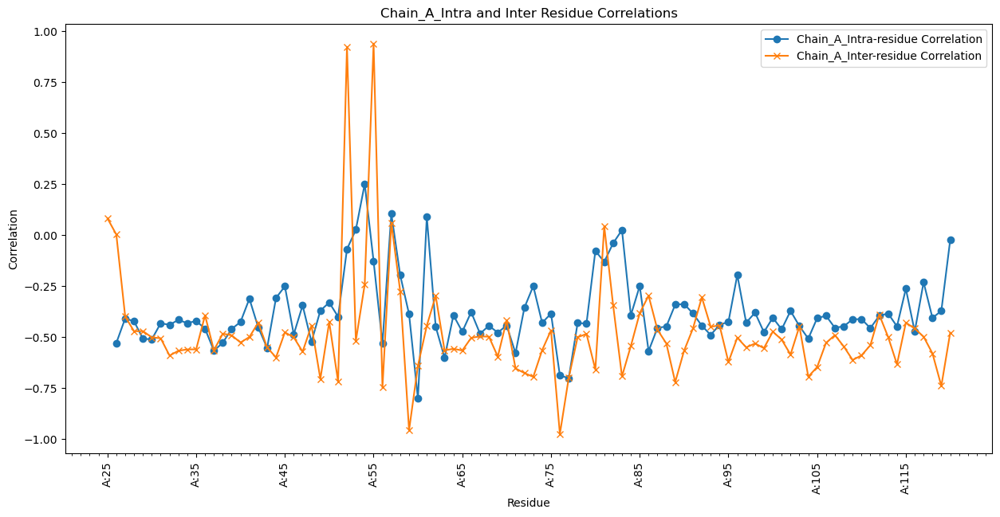

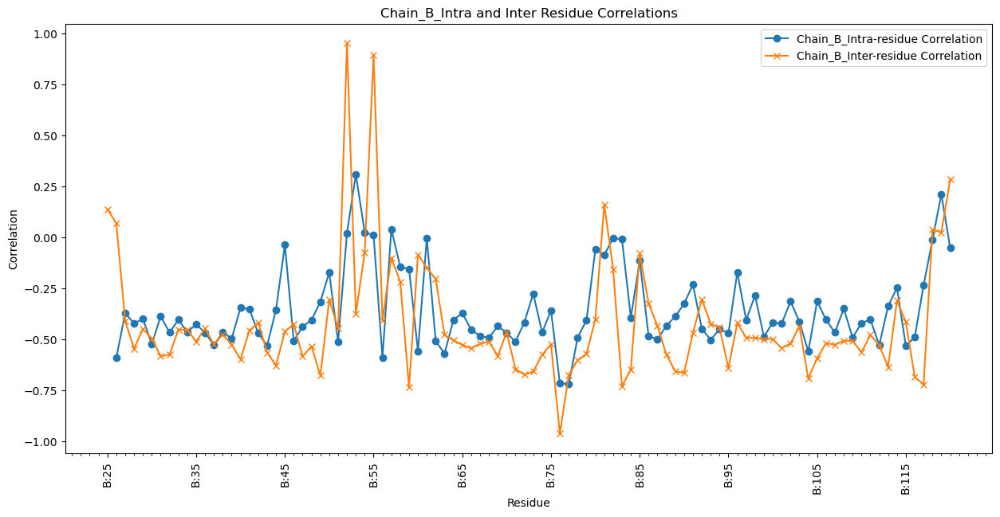

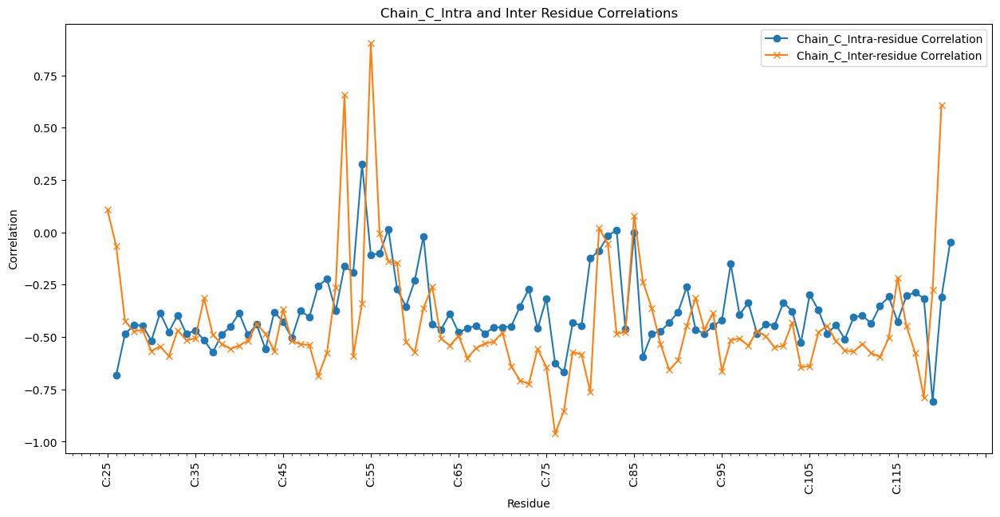

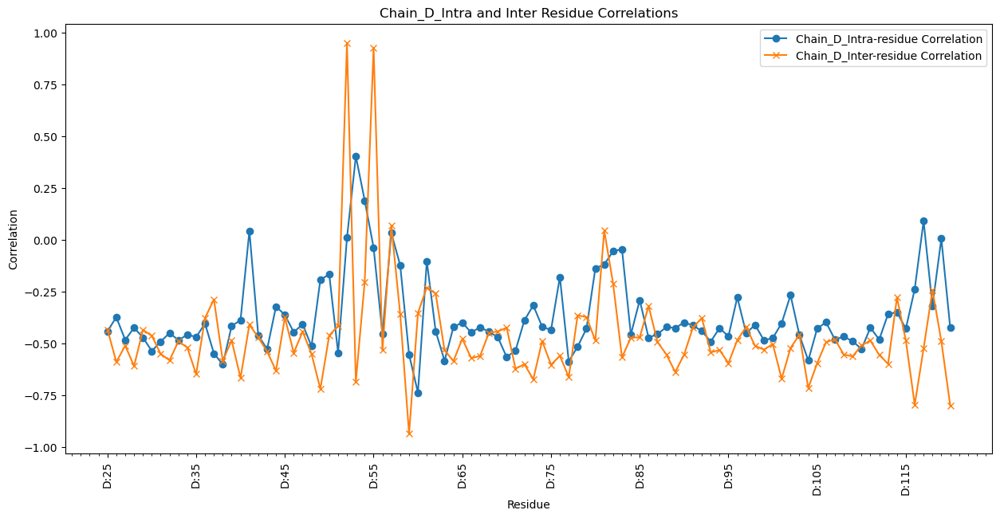

In [12]:
#plot the correlation
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
for chain, i in zip(['A', 'B', 'C', 'D'], range(4)):

    inter_correlation = KcsA_analyzer[i].calculate_inter_residue_correlation()
    intra_correlation = KcsA_analyzer[i].calculate_intra_residue_correlation()
    # Extract residues and their corresponding correlations
    residues = list(intra_correlation.keys())
    intra_values = list(intra_correlation.values())
    inter_values = list(inter_correlation.values())

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15, 7))

    # Plot intra-residue correlations
    ax.plot(residues, intra_values, label=f'Chain_{chain}_Intra-residue Correlation', marker='o')

    # Plot inter-residue correlations
    ax.plot(residues[:-1], inter_values, label=f'Chain_{chain}_Inter-residue Correlation', marker='x')


    # Set labels and title
    ax.set_xlabel('Residue')
    ax.set_ylabel('Correlation')
    ax.set_title(f'Chain_{chain}_Intra and Inter Residue Correlations')
    ax.legend()

    # Set up major and minor tickers
    major_locator = MultipleLocator(10)  # Adjust to the desired spacing of major ticks
    minor_locator = MultipleLocator(1)   # Adjust to the desired spacing of minor ticks

    ax.xaxis.set_major_locator(major_locator)
    ax.xaxis.set_minor_locator(minor_locator)

    # Rotate x-axis labels for better readability and only show for major ticks
    ax.tick_params(axis='x', which='major', labelrotation=90)
    ax.tick_params(axis='x', which='minor', labelbottom=False)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=90)
    plt.savefig(f'intra_inter_residue_correlation_chain_{chain}.png', dpi=300, bbox_inches='tight')
    plt.show()

/Users/yunyao_1/miniforge3/envs/KcsA_torsion/lib/python3.8/site-packages/MDAnalysis/analysis/base.py:438: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[i] = ts.time


Combined plot saved as KcsA_Rama_plots_chainA/Combined_Ramachandran_1k4c.png


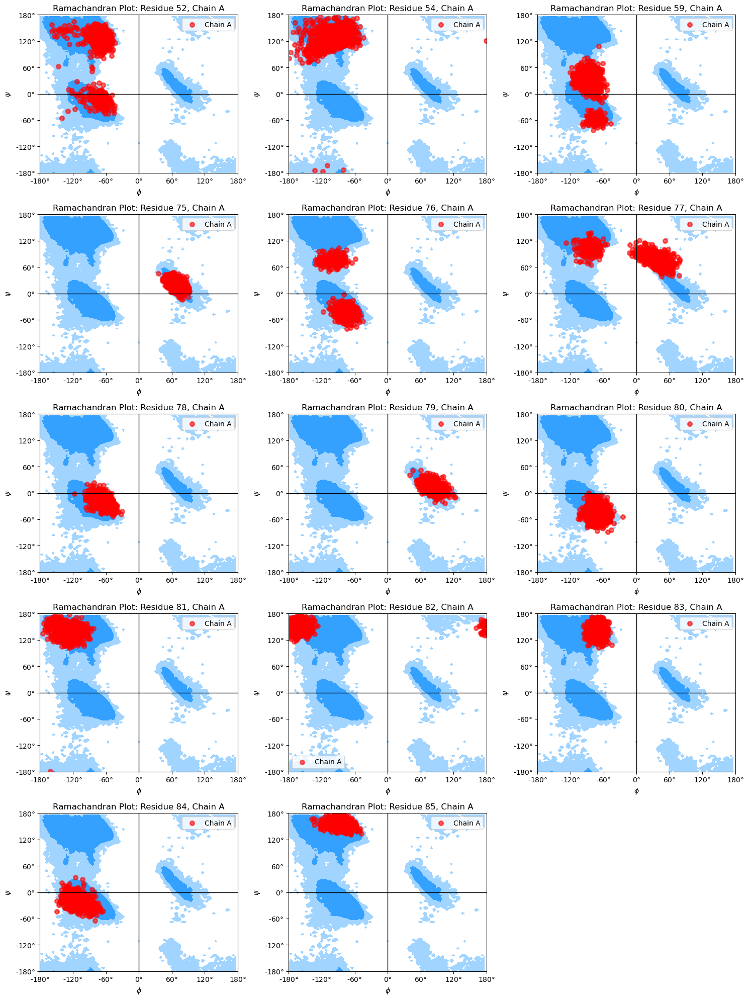

Combined plot saved as KcsA_Rama_plots_chainB/Combined_Ramachandran_1k4c.png


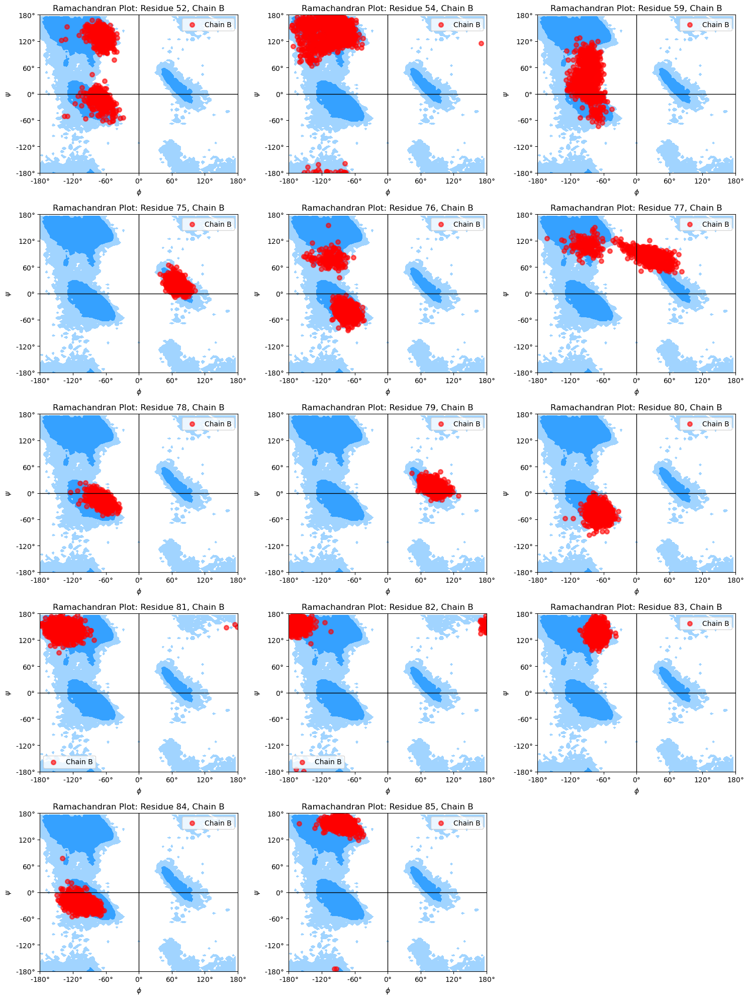

Combined plot saved as KcsA_Rama_plots_chainC/Combined_Ramachandran_1k4c.png


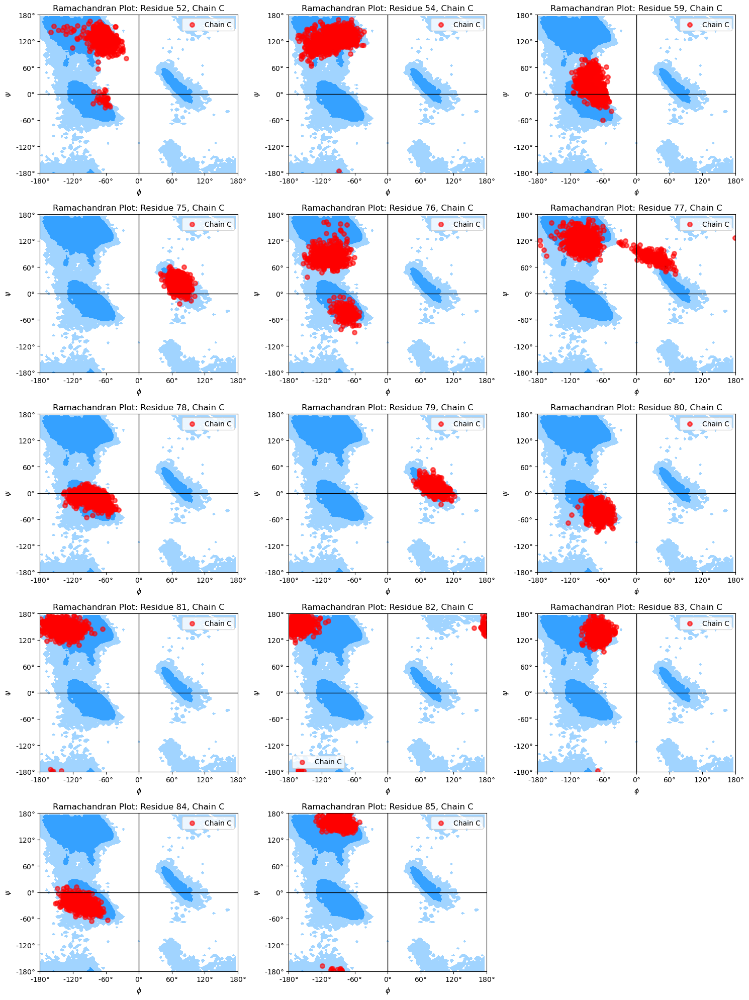

Combined plot saved as KcsA_Rama_plots_chainD/Combined_Ramachandran_1k4c.png


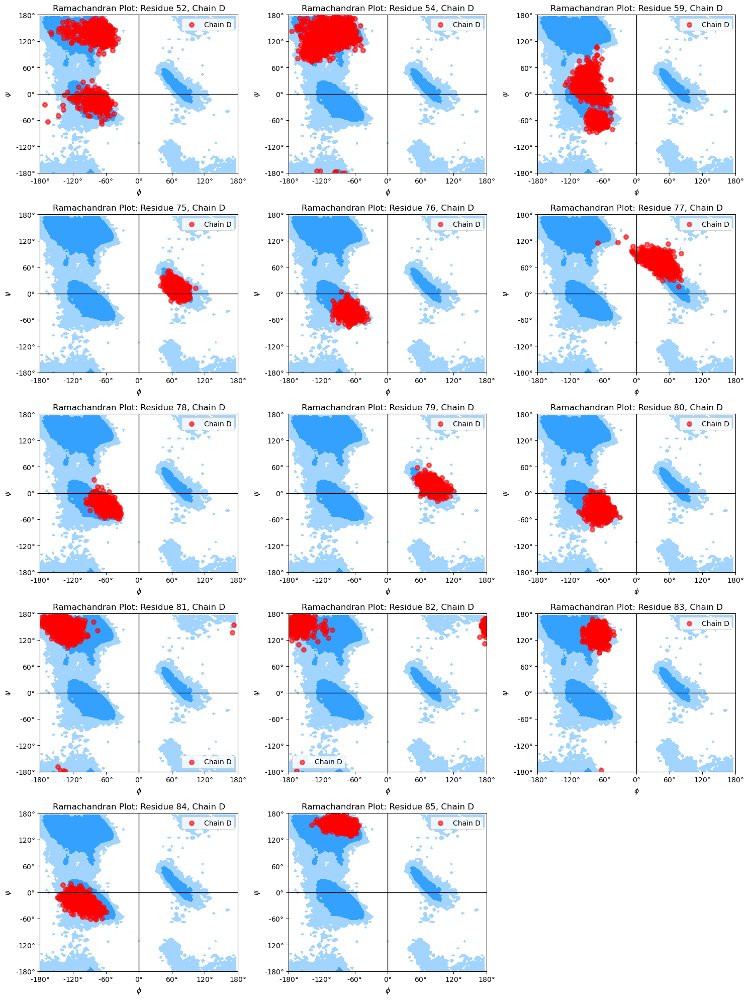

In [13]:
# plot residue torsion angles over Ramachandran plot
residues_to_plot=[52, 54, 59, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
#chains=['A']
#DHFR_analyzer.plot_ramachandran(residue_index='23', PDB_code='1rx1', chain='A', output_dir='DHFR_Rama_plots2') 
for chain, i in zip(['A', 'B', 'C', 'D'], range(4)):
#for chain, i in zip(['D'], [3]):
    KcsA_analyzer[i].plot_all_ramachandran(residue_indices=residues_to_plot, PDB_code='1k4c', PDB_chain='C', chains=[chain], output_dir=f'KcsA_Rama_plots_chain{chain}')

Combined plot saved as KcsA_scatter_plots_ChainA/inter_intra_torsion_scatter_52.png


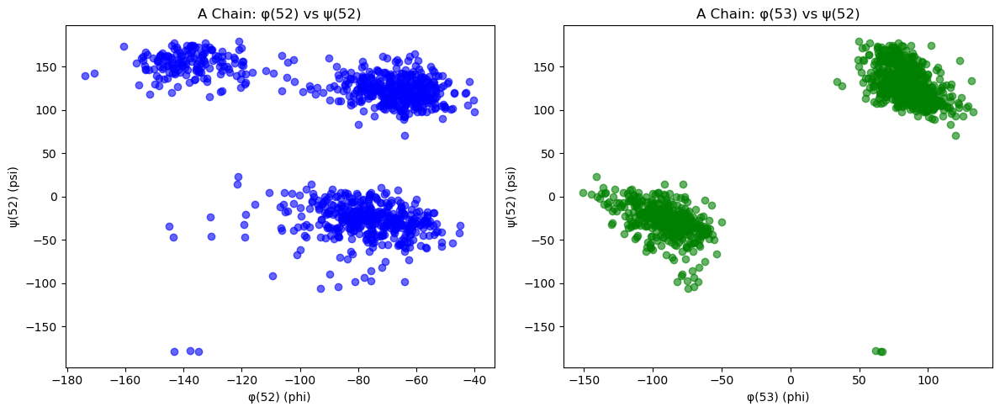

In [28]:
residues_to_plot=[52]
for residue in residues_to_plot:
    KcsA_analyzer[0].plot_scatter(residue, chains='A', output_dir='KcsA_scatter_plots_ChainA')

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_52.png


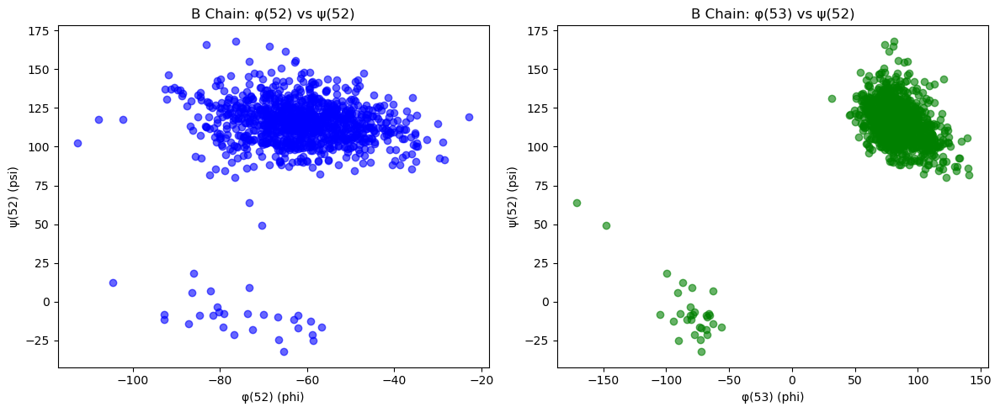

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_79.png


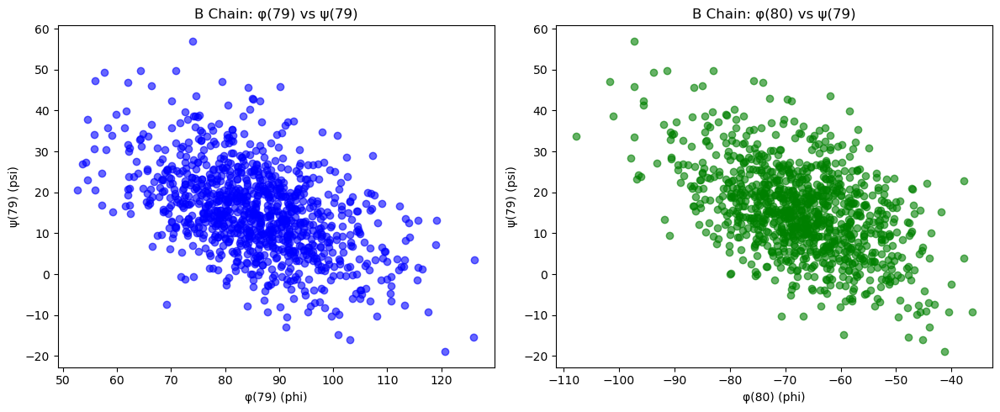

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_80.png


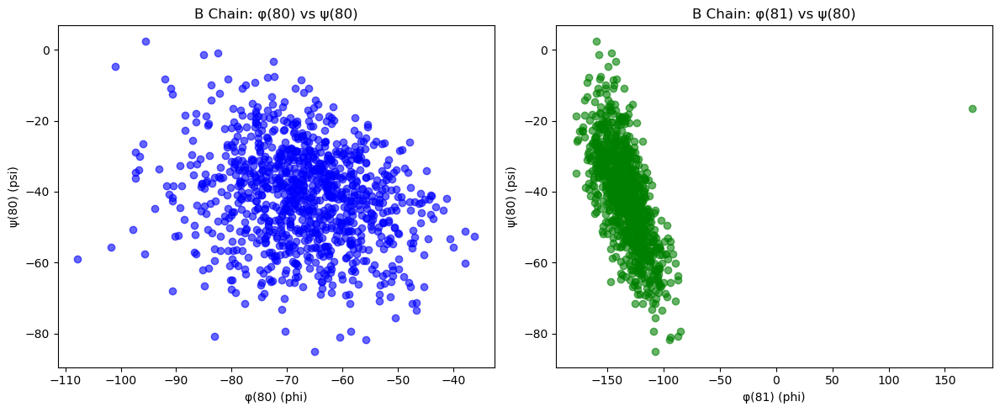

In [29]:
residues_to_plot=[52, 79, 80]
for residue in residues_to_plot:
    KcsA_analyzer[1].plot_scatter(residue, chains='B', output_dir='KcssA_scatter_plots_ChainB')

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_52.png


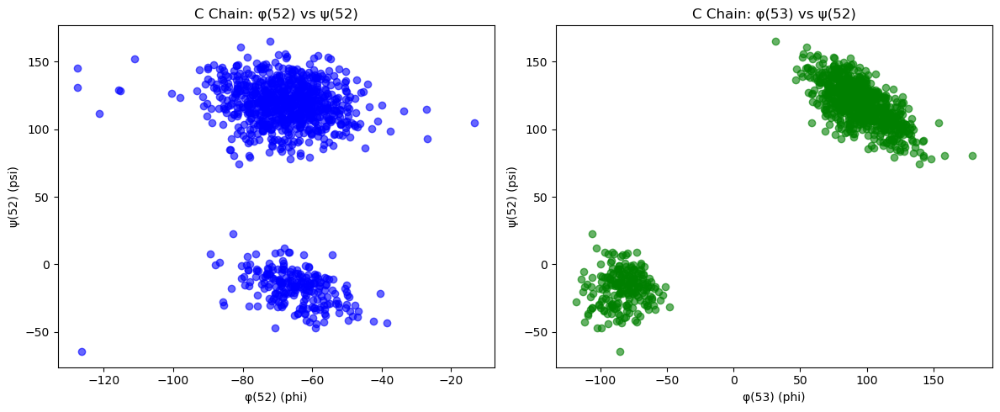

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_77.png


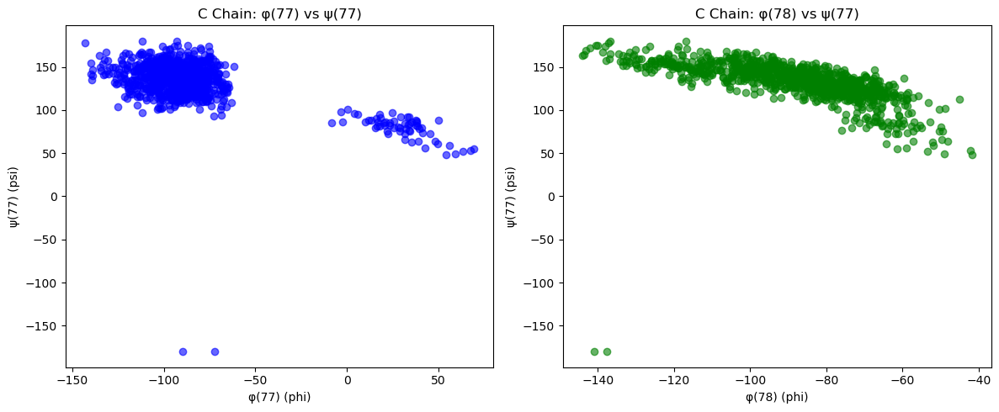

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_78.png


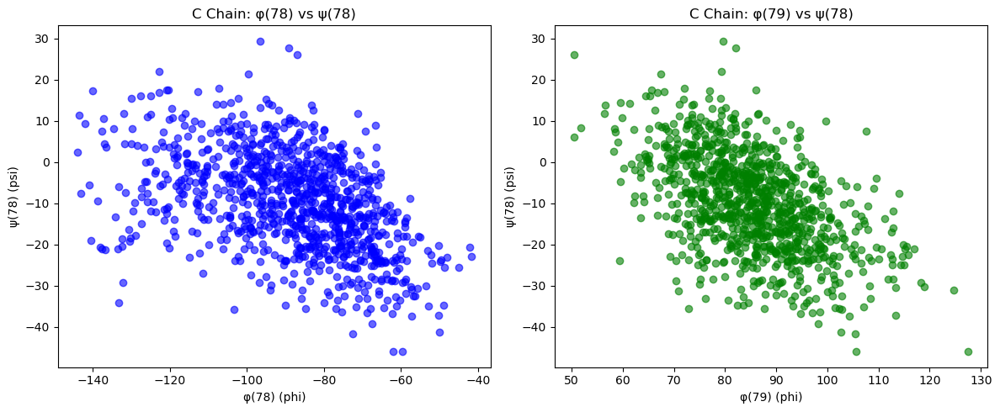

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_79.png


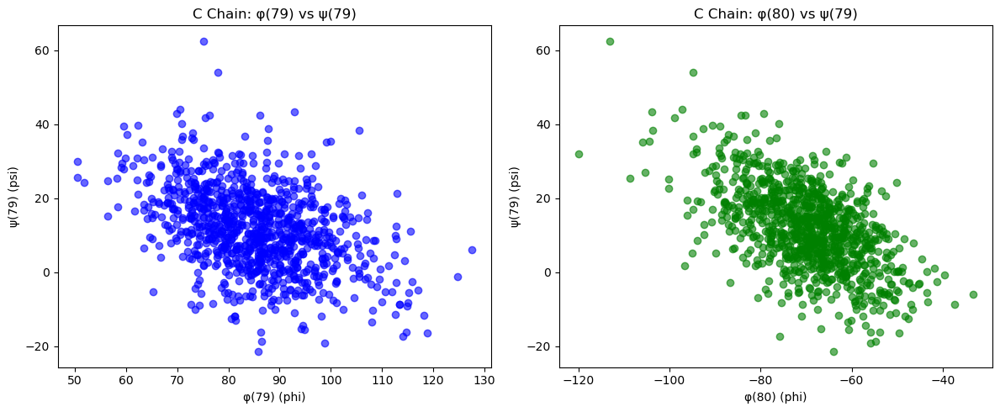

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_80.png


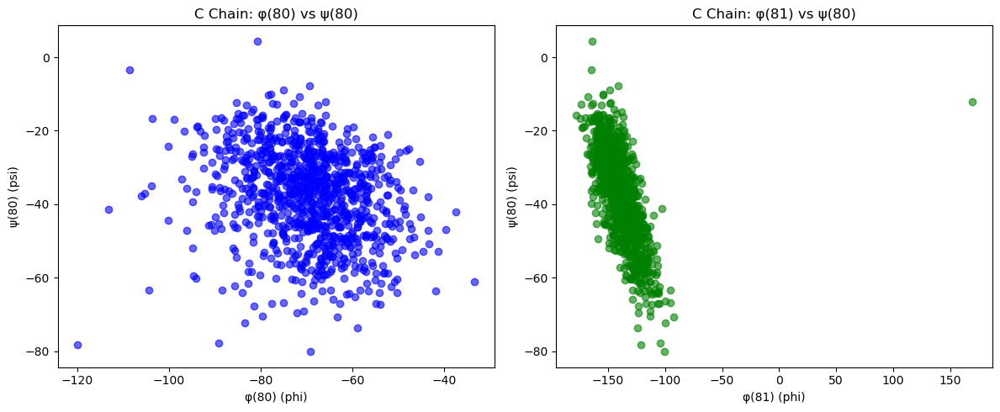

In [30]:
residues_to_plot=[52, 77, 78, 79, 80]
for residue in residues_to_plot:
    KcsA_analyzer[2].plot_scatter(residue, chains='C', output_dir='KcssA_scatter_plots_ChainC')

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_77.png


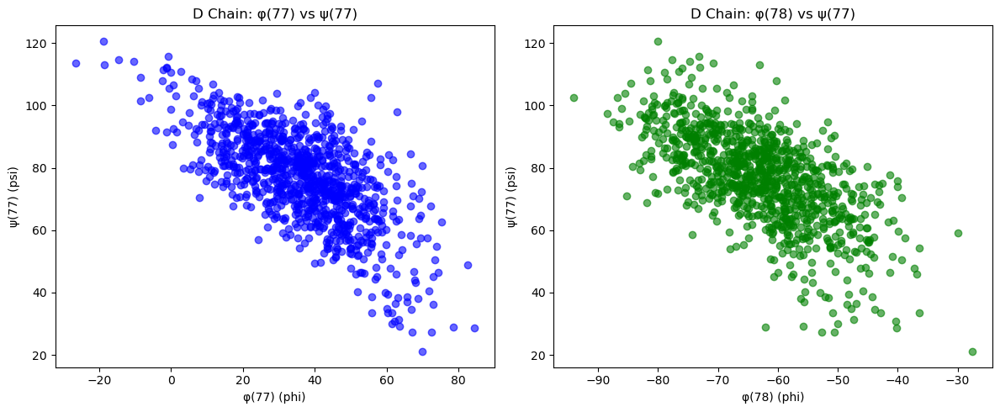

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_78.png


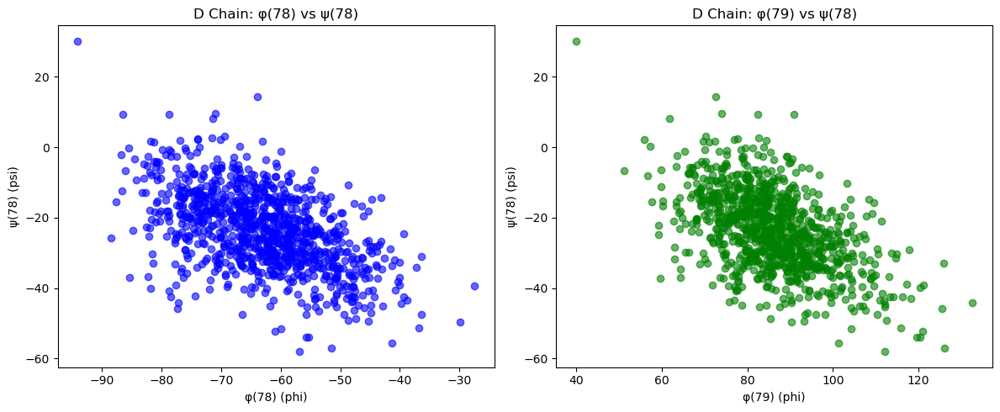

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_79.png


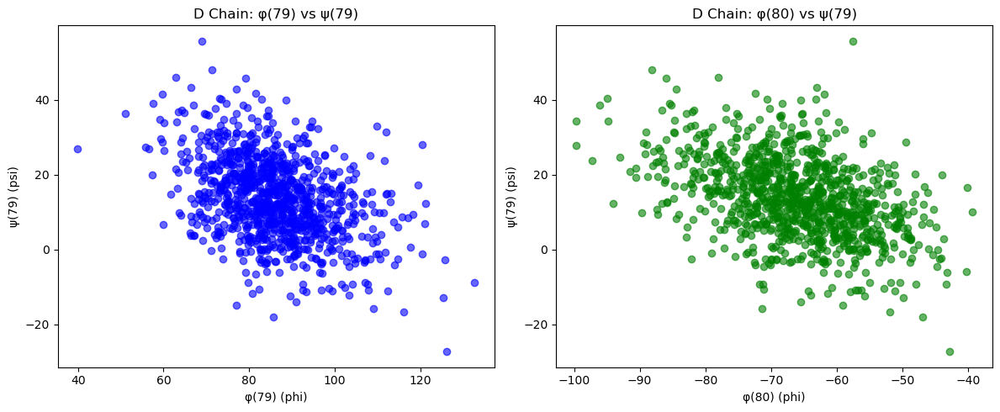

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_80.png


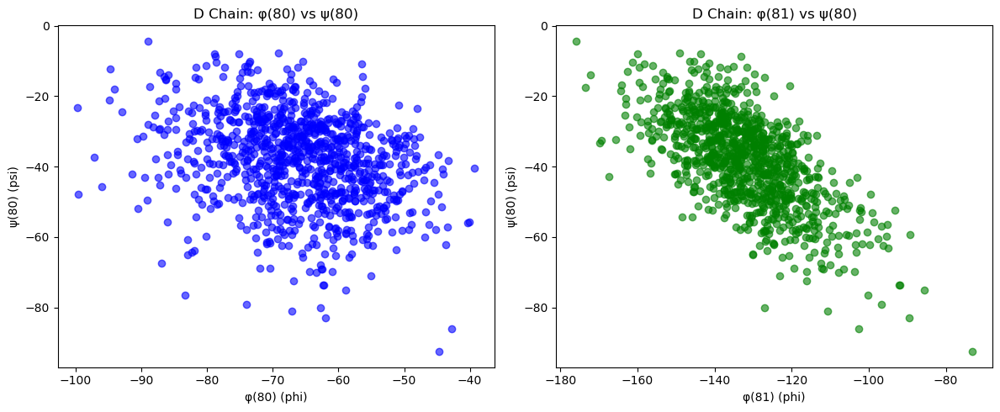

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_81.png


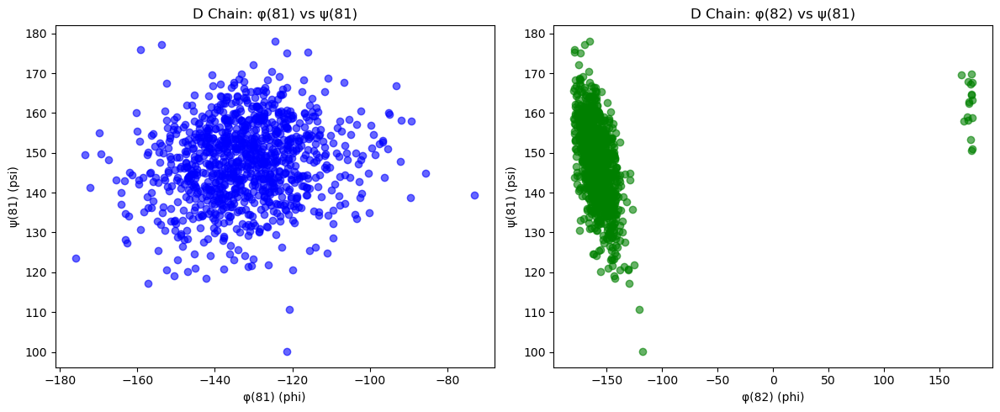

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_82.png


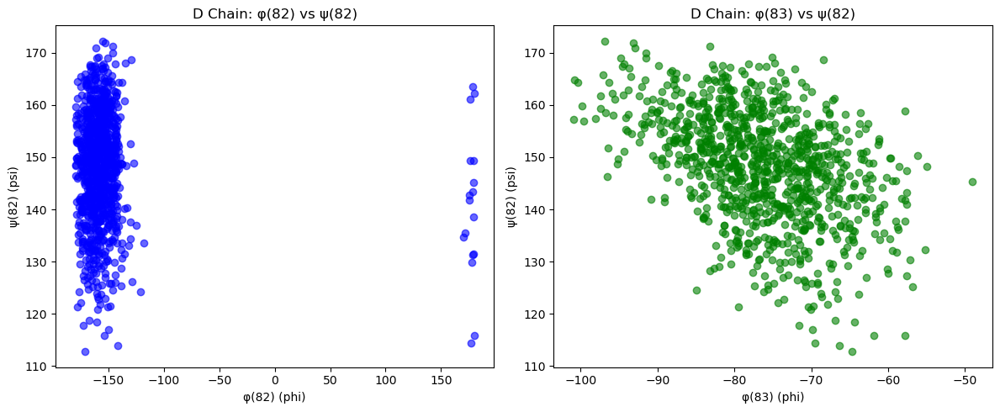

In [31]:
residues_to_plot=[77, 78, 79, 80,81, 82]
for residue in residues_to_plot:
    KcsA_analyzer[3].plot_scatter(residue, chains='D', output_dir='KcssA_scatter_plots_ChainD')

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_51_Chain_A.png


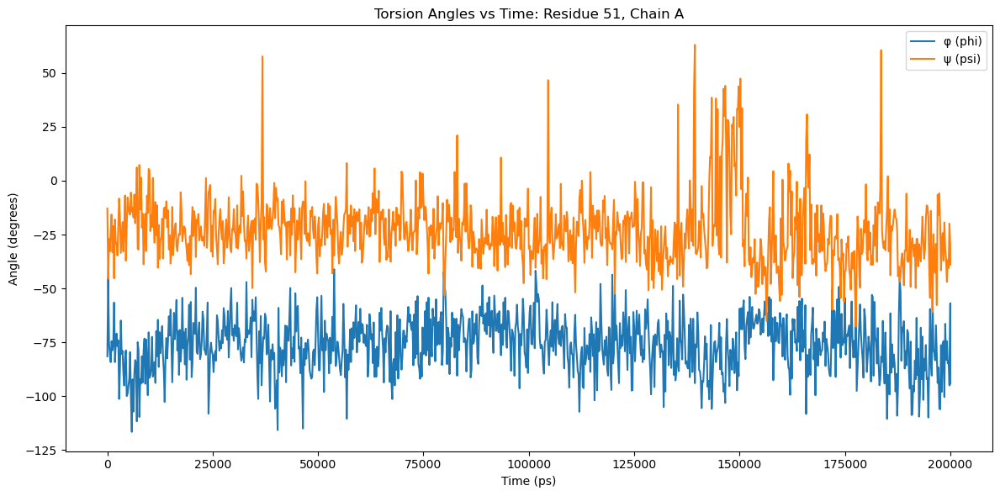

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_51_Chain_A.png


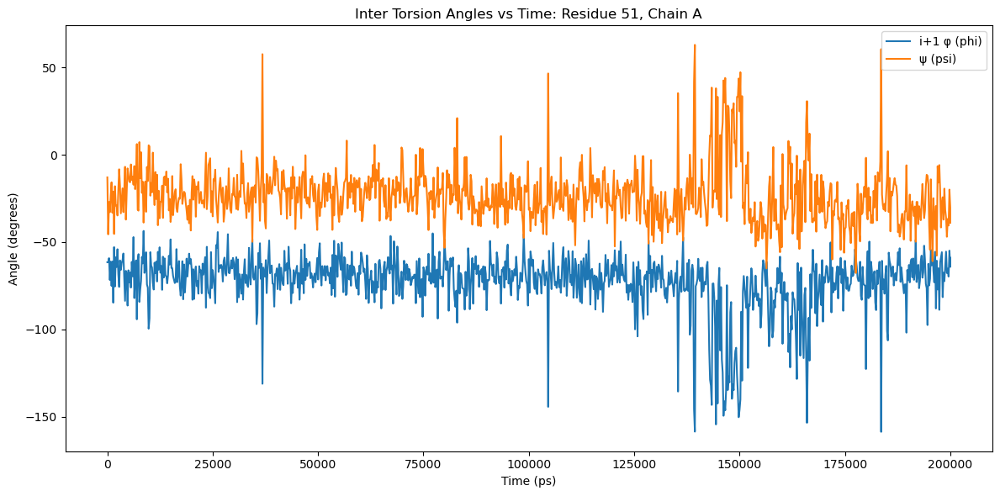

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_52_Chain_A.png


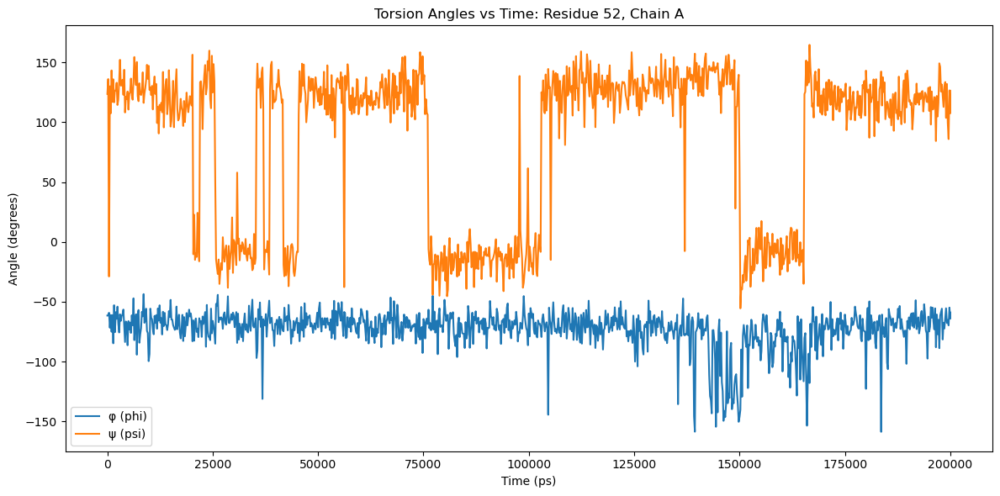

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_52_Chain_A.png


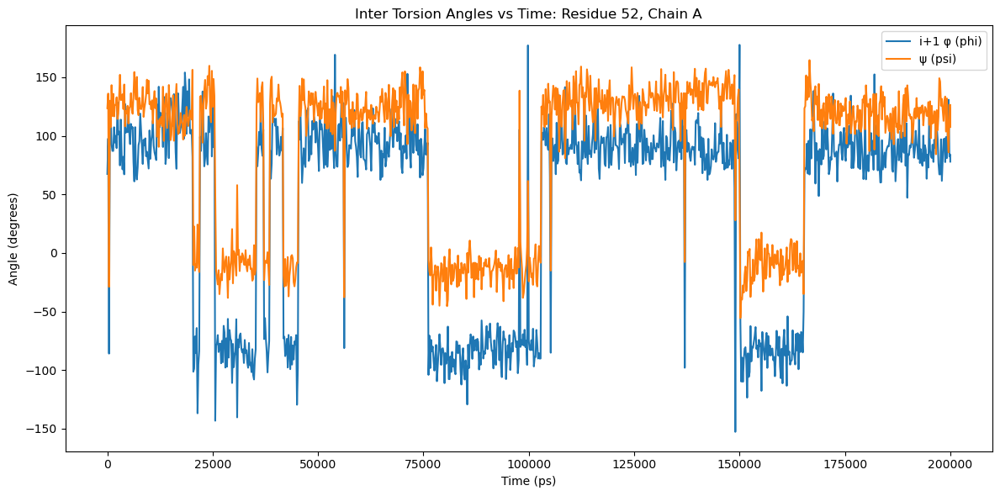

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_54_Chain_A.png


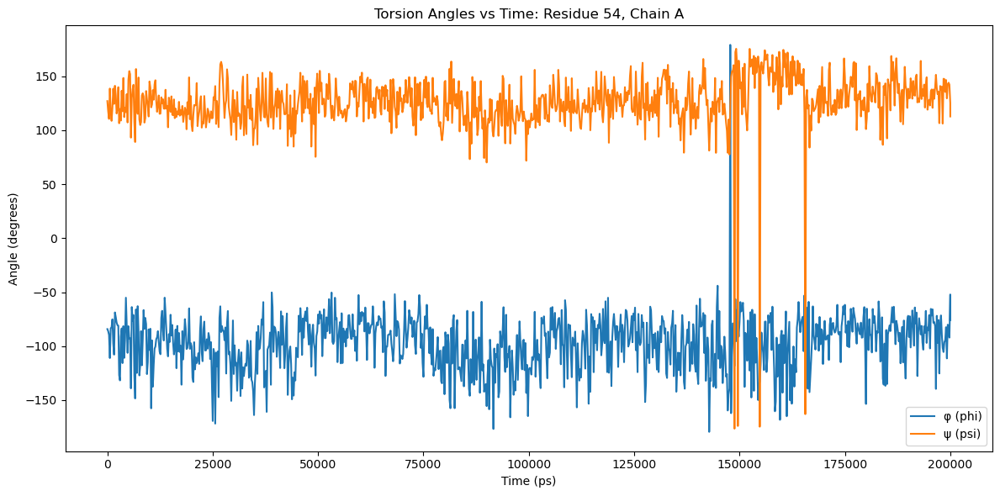

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_54_Chain_A.png


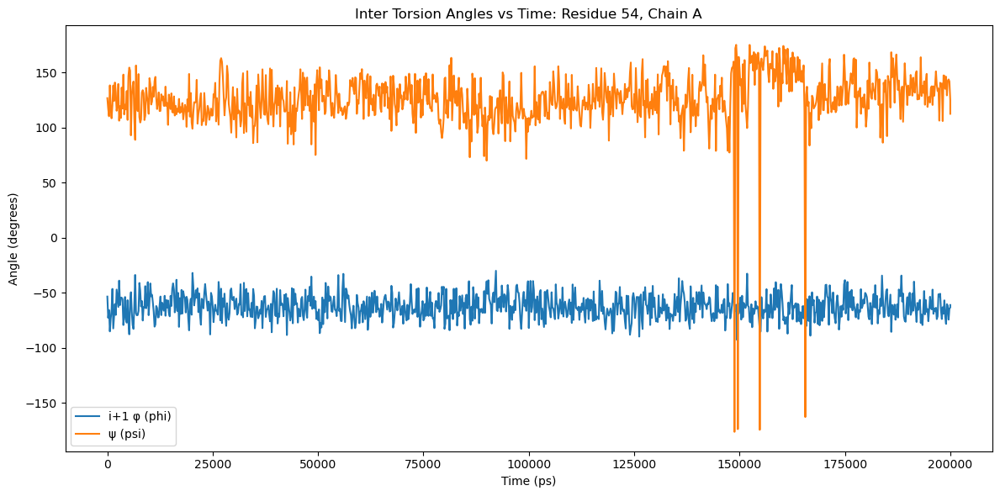

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_76_Chain_A.png


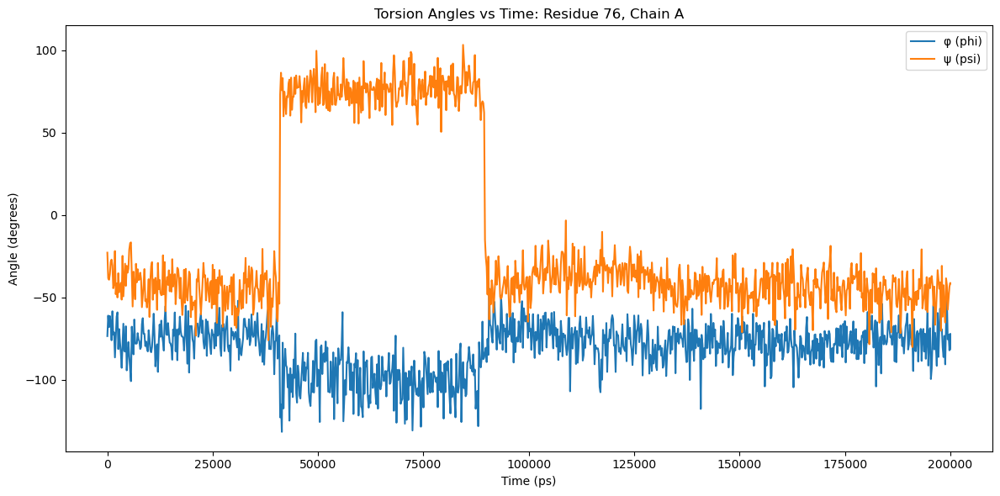

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_76_Chain_A.png


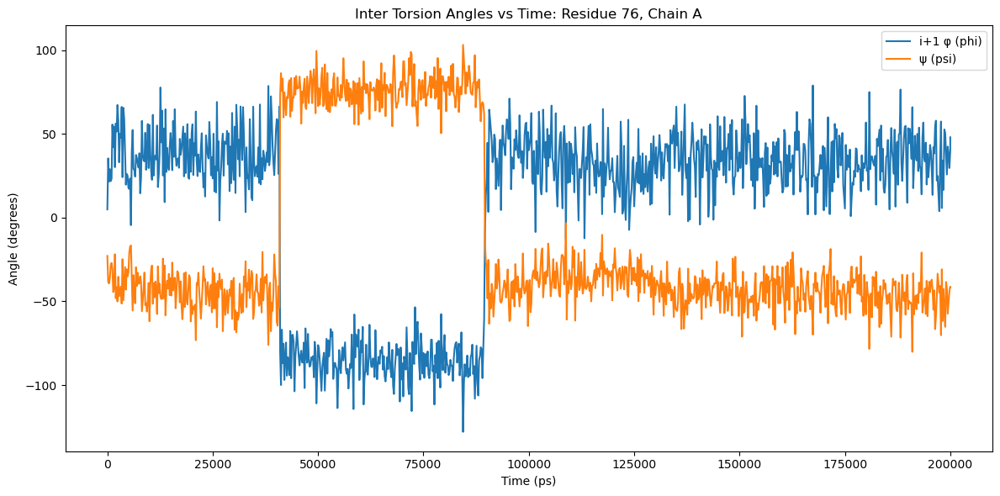

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_77_Chain_A.png


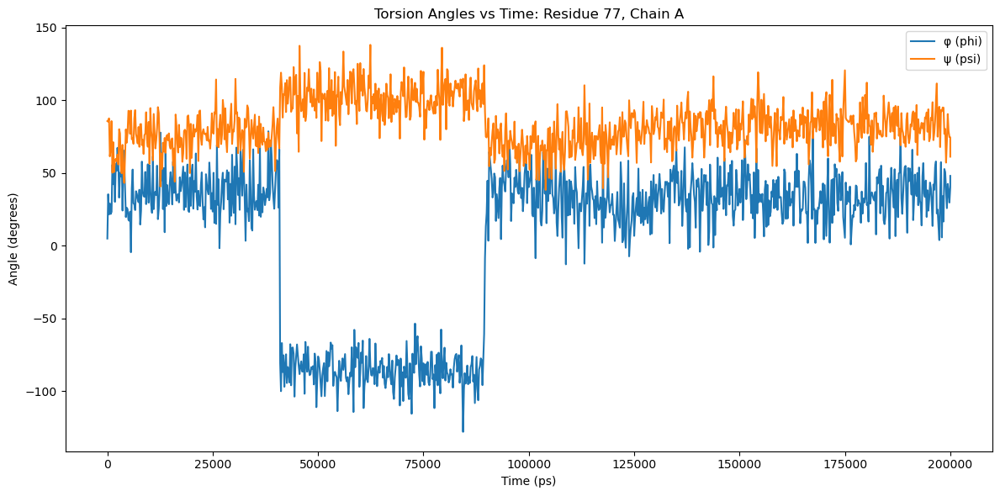

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_77_Chain_A.png


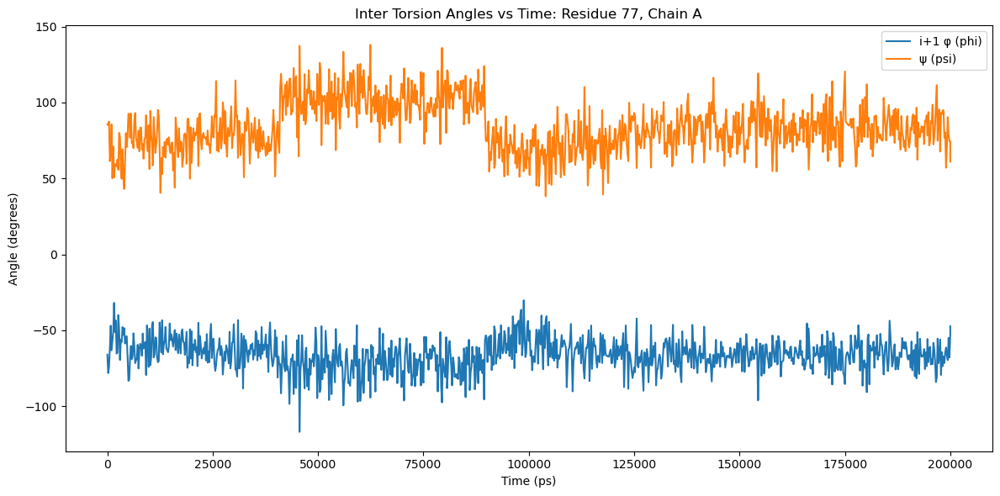

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_78_Chain_A.png


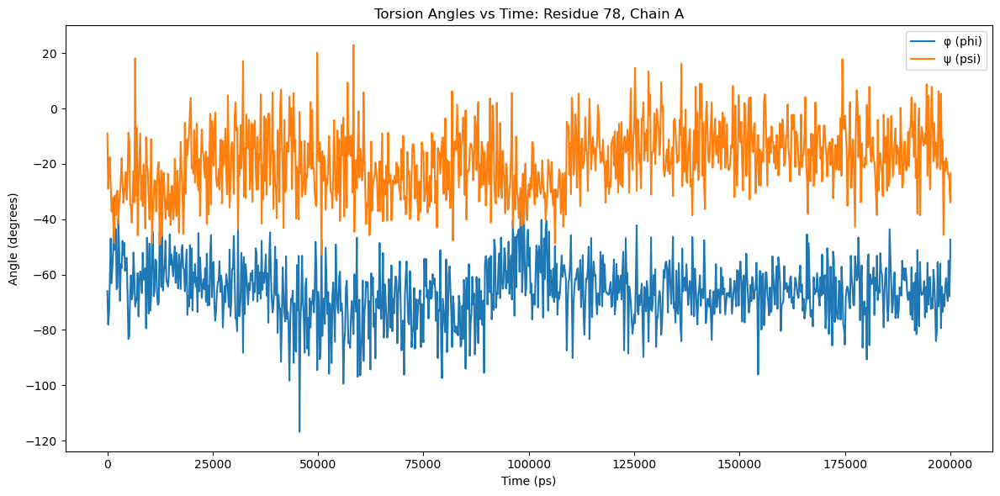

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_78_Chain_A.png


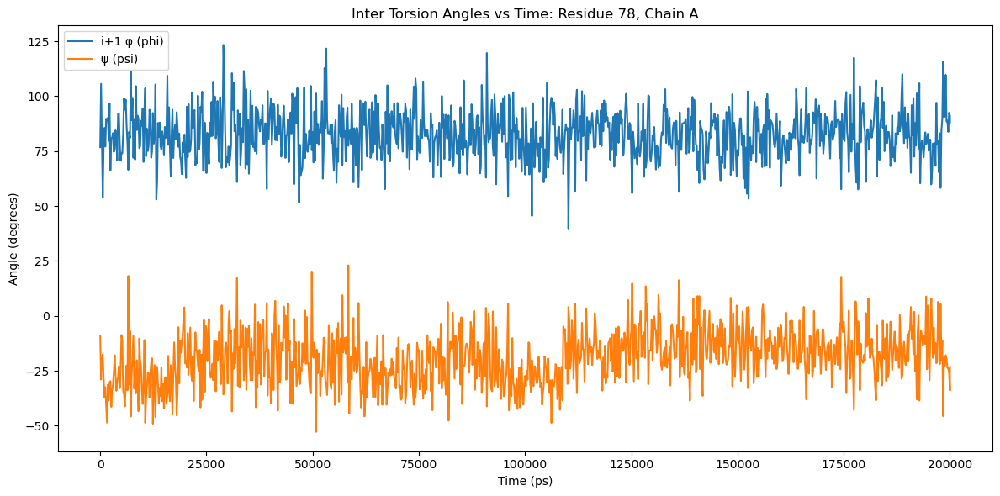

In [14]:
from torsion_analysis_module2 import *
# import plot functions to plot torsion angles(intra and inter) vs time 

# plot the torsion angles over time
residues_to_plot=[51, 52,54,76, 77, 78]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='A', analyzer=KcsA_analyzer[0], output_dir='KcsA_torsion_vs_time_ChainA')
    plot_inter_torsion_vs_time(residue=residue, chain='A', analyzer=KcsA_analyzer[0], output_dir='KcsA_inter_torsion_vs_time_ChainA')

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_52_Chain_B.png


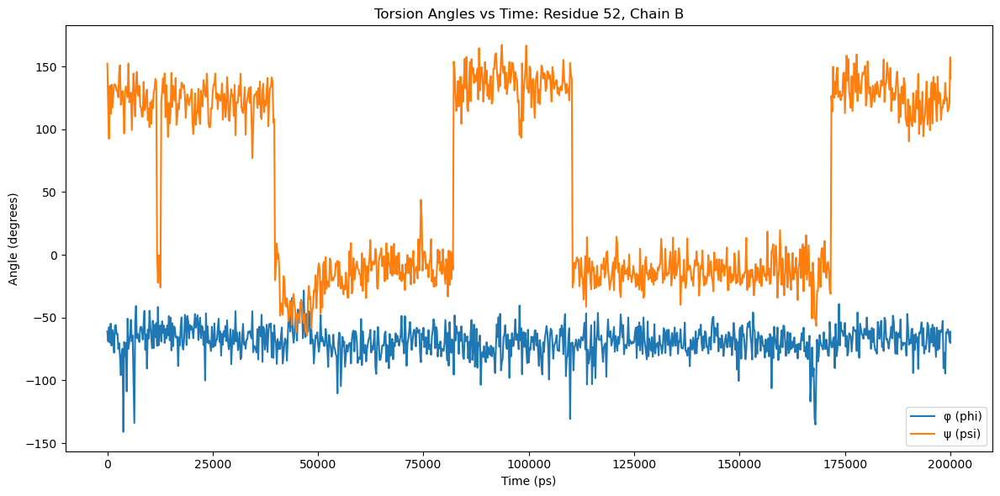

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_52_Chain_B.png


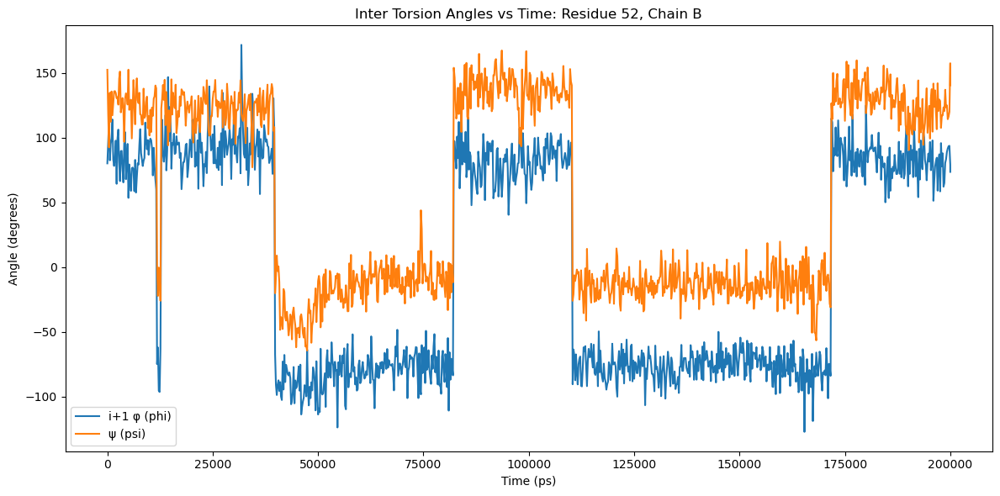

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_54_Chain_B.png


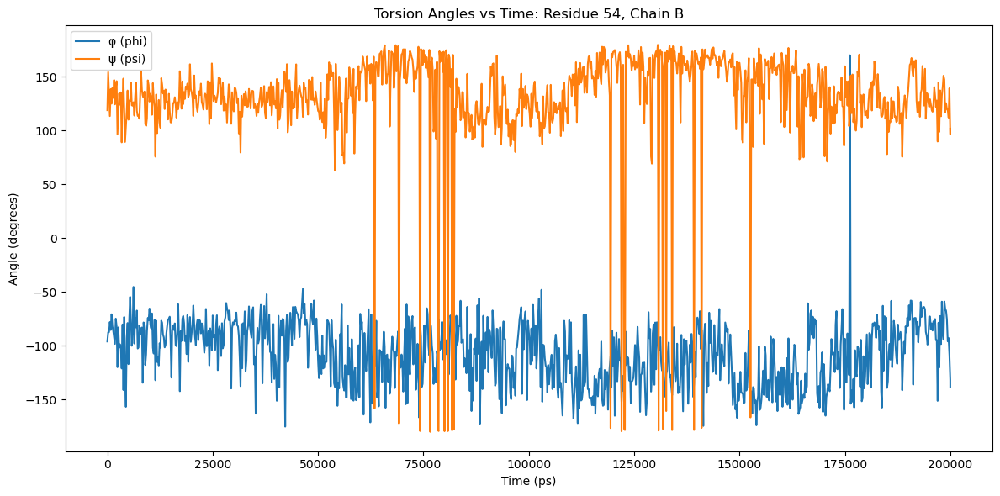

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_54_Chain_B.png


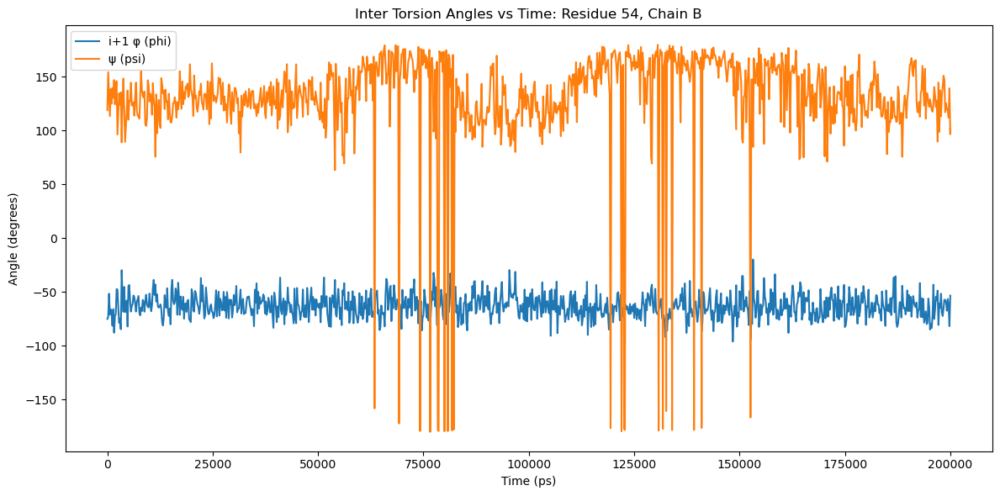

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_76_Chain_B.png


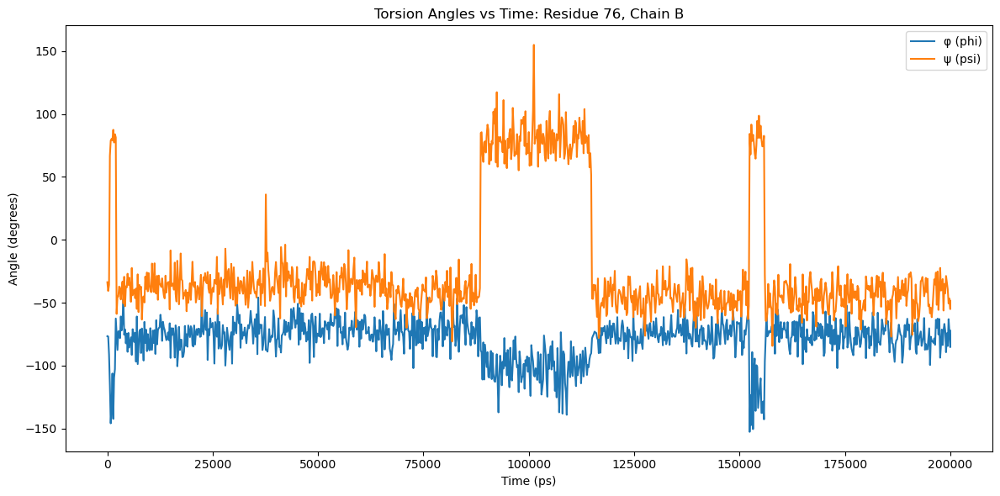

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_76_Chain_B.png


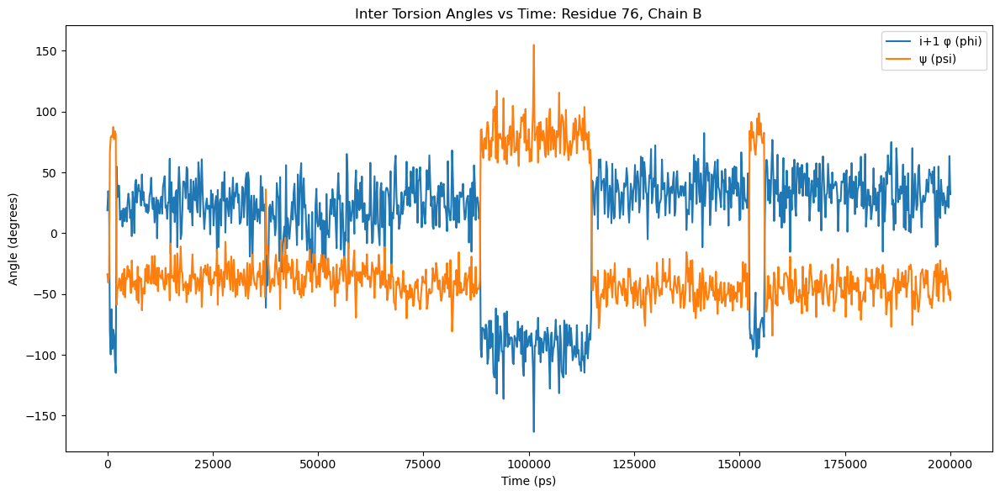

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_77_Chain_B.png


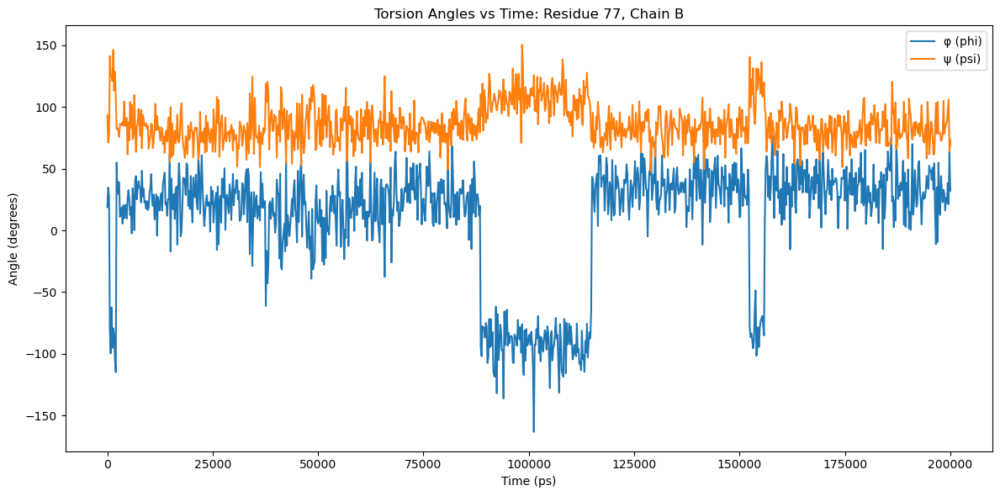

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_77_Chain_B.png


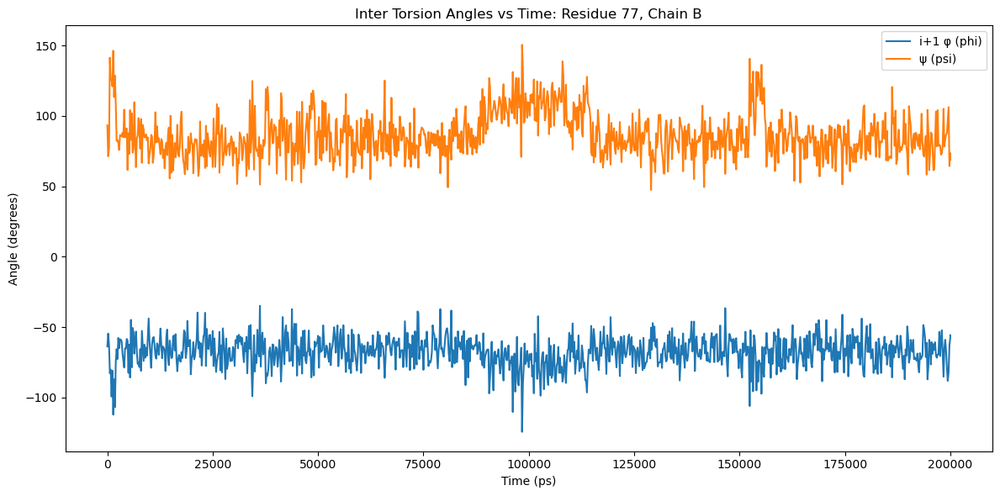

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_78_Chain_B.png


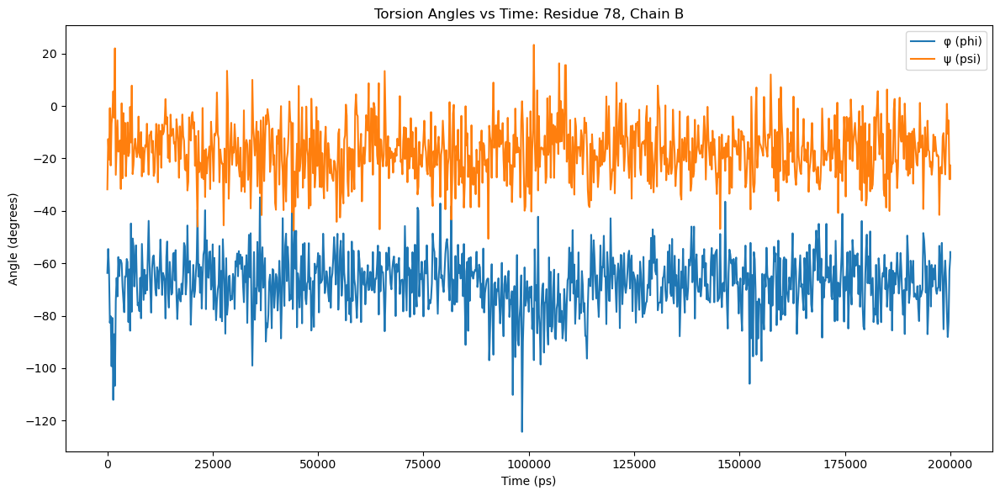

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_78_Chain_B.png


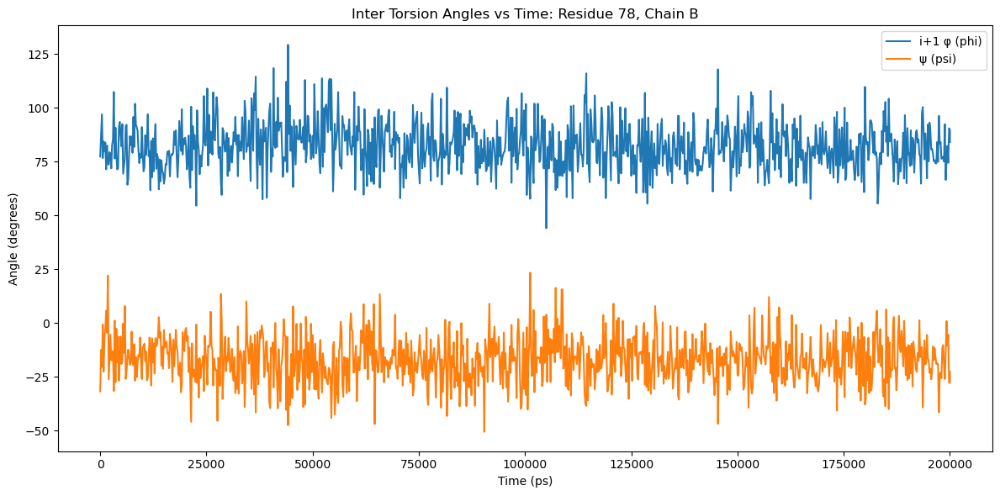

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_79_Chain_B.png


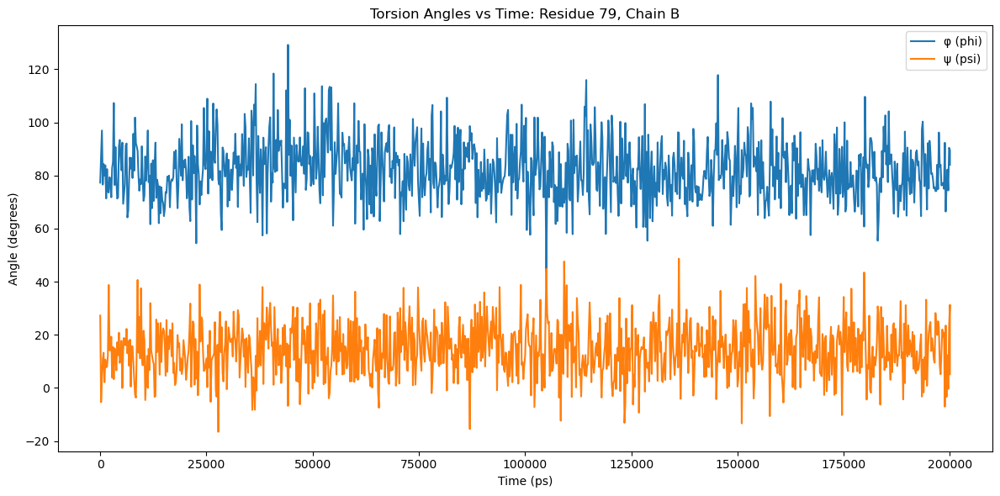

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_79_Chain_B.png


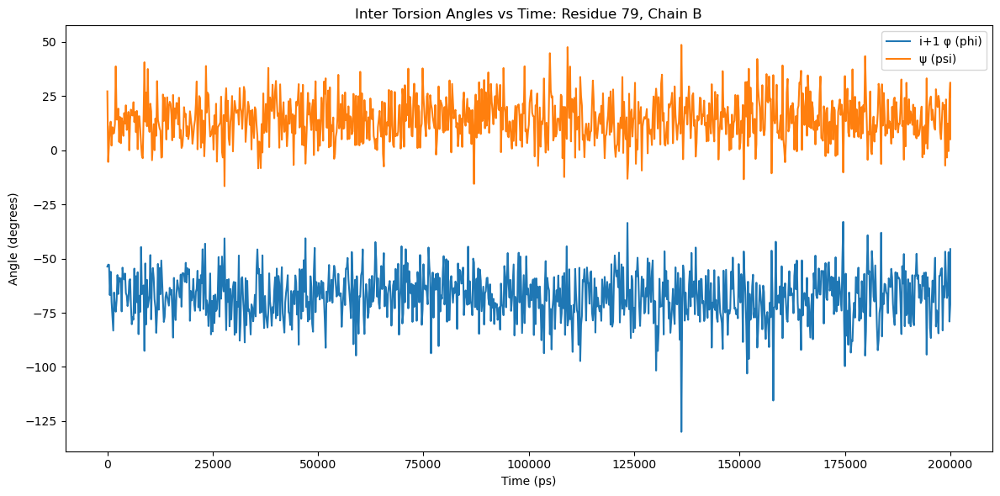

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_80_Chain_B.png


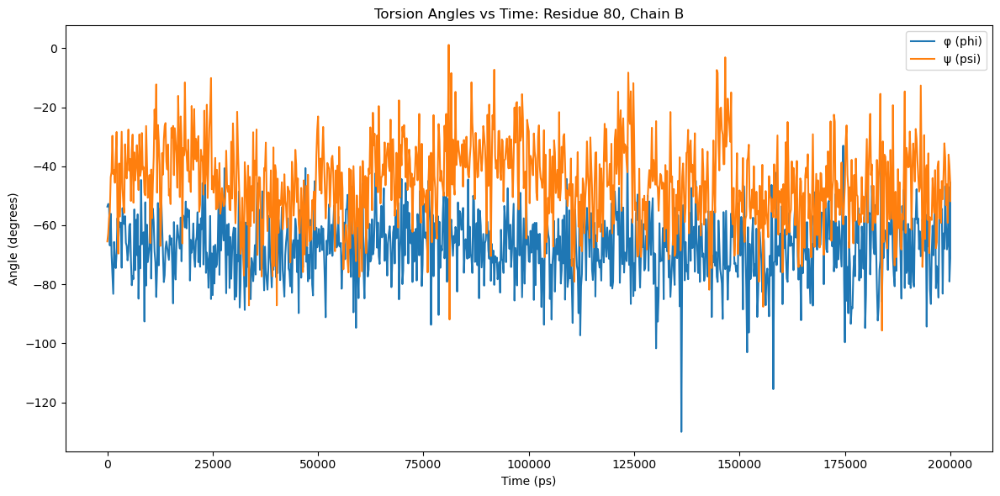

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_80_Chain_B.png


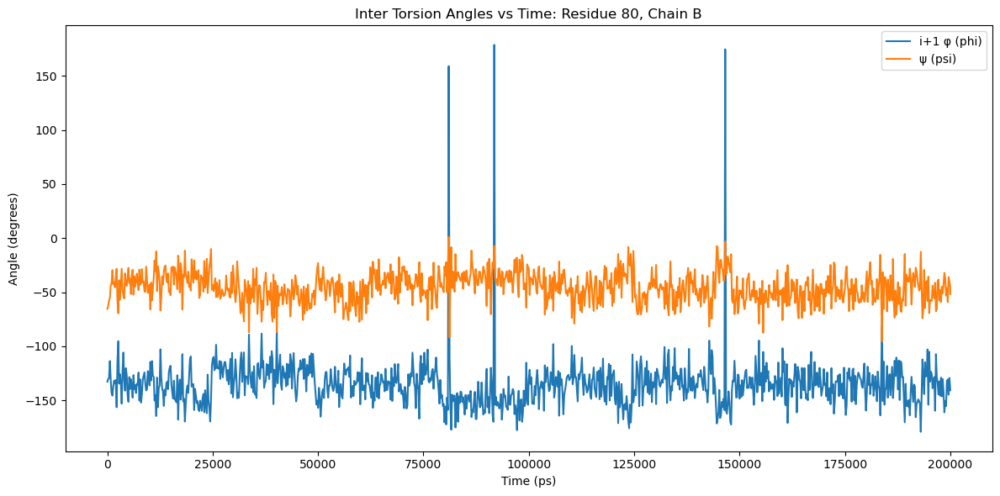

In [15]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='B', analyzer=KcsA_analyzer[1], output_dir='KcsA_torsion_vs_time_ChainB')
    plot_inter_torsion_vs_time(residue=residue, chain='B', analyzer=KcsA_analyzer[1], output_dir='KcsA_inter_torsion_vs_time_ChainB')

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_52_Chain_C.png


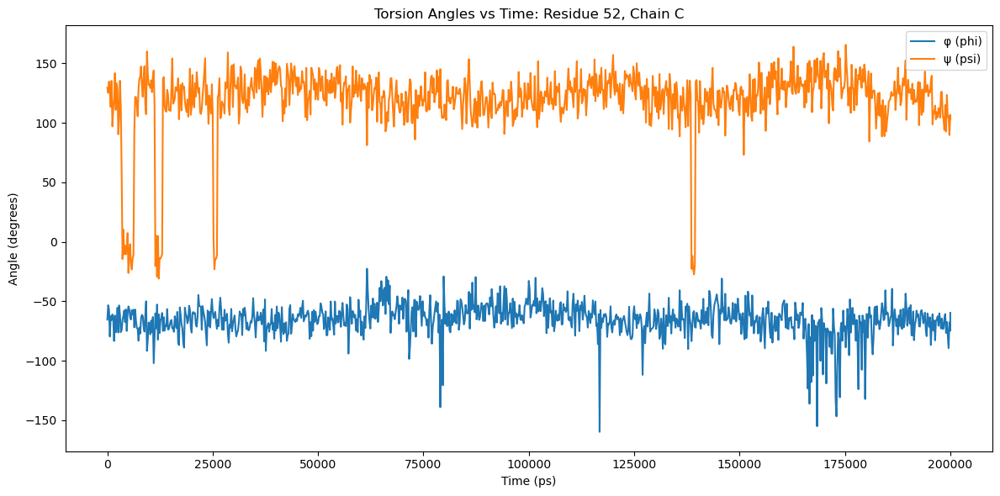

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_52_Chain_C.png


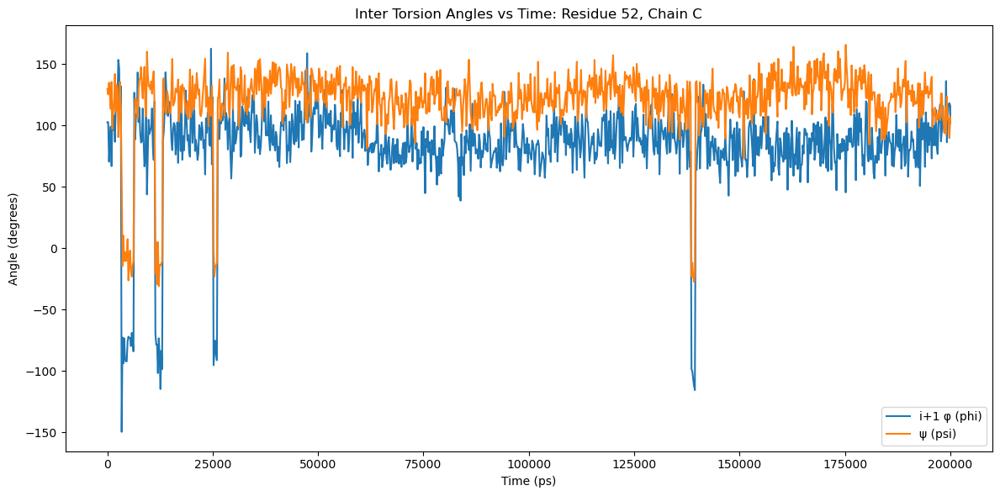

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_54_Chain_C.png


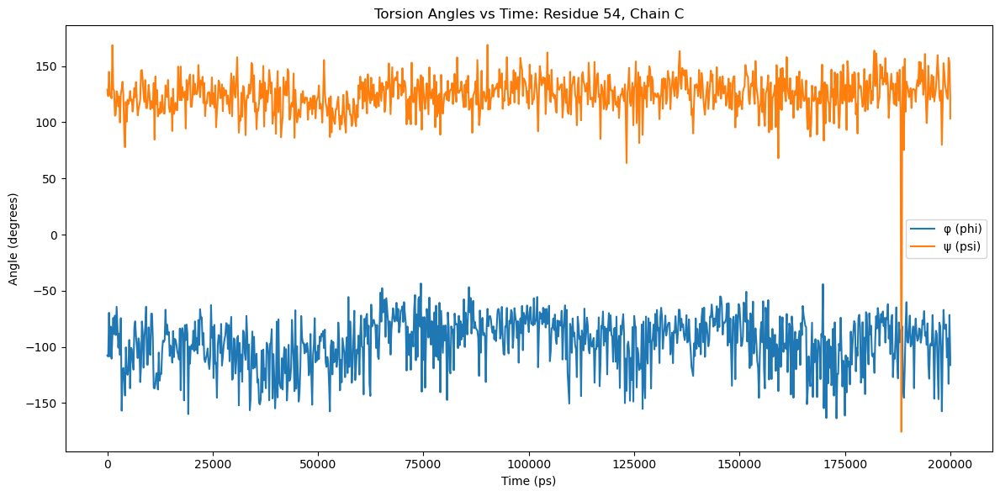

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_54_Chain_C.png


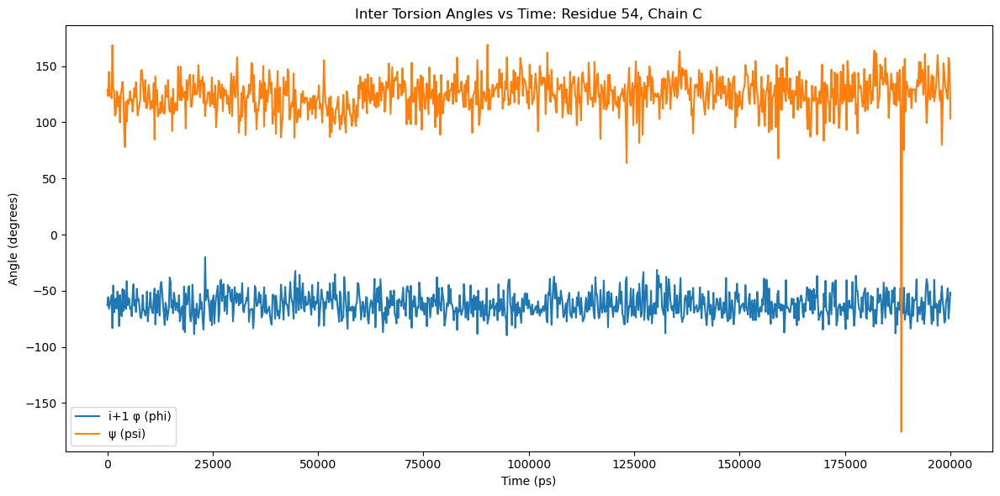

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_76_Chain_C.png


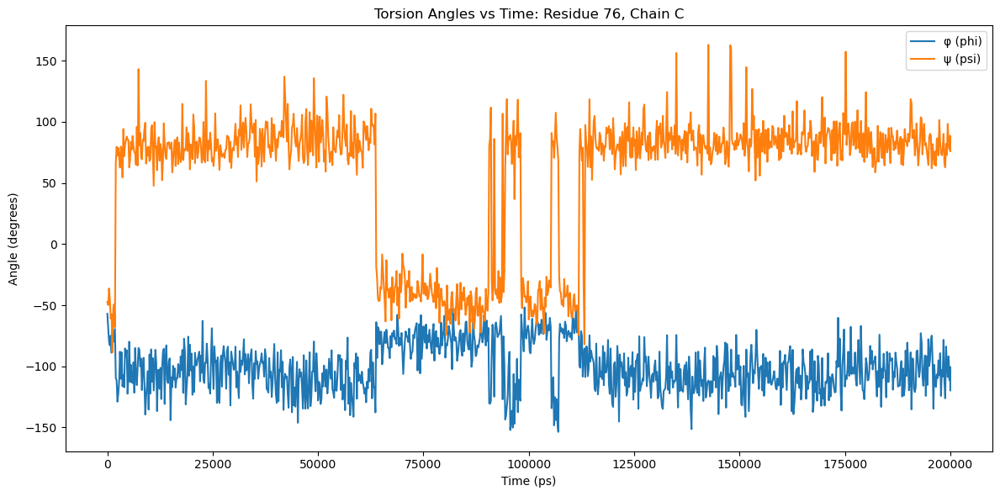

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_76_Chain_C.png


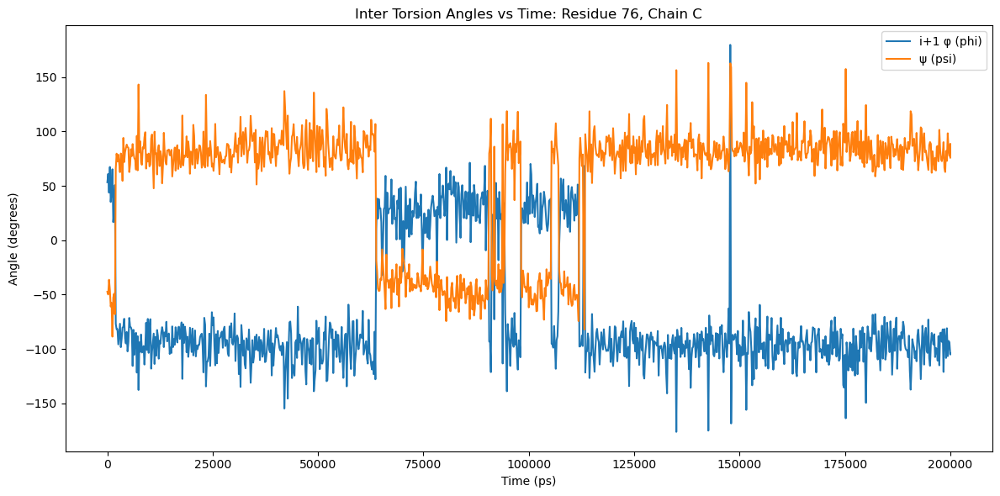

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_77_Chain_C.png


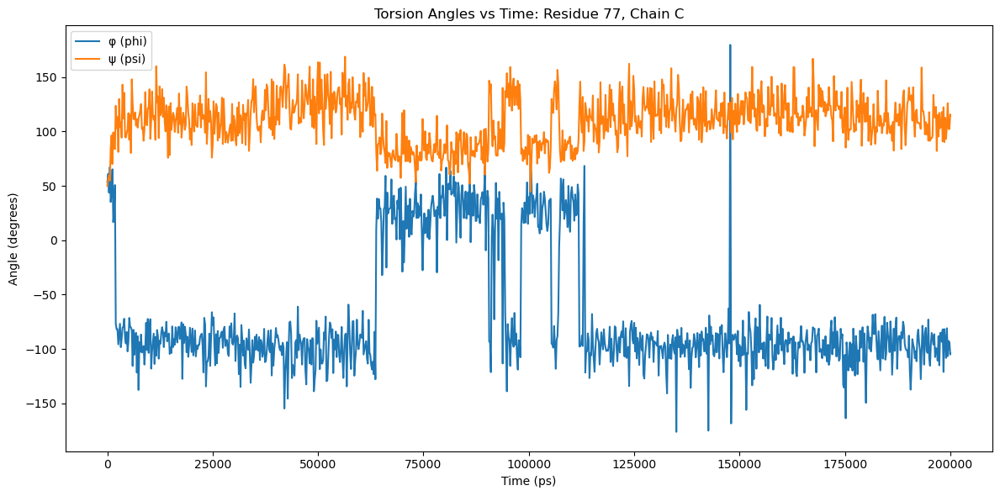

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_77_Chain_C.png


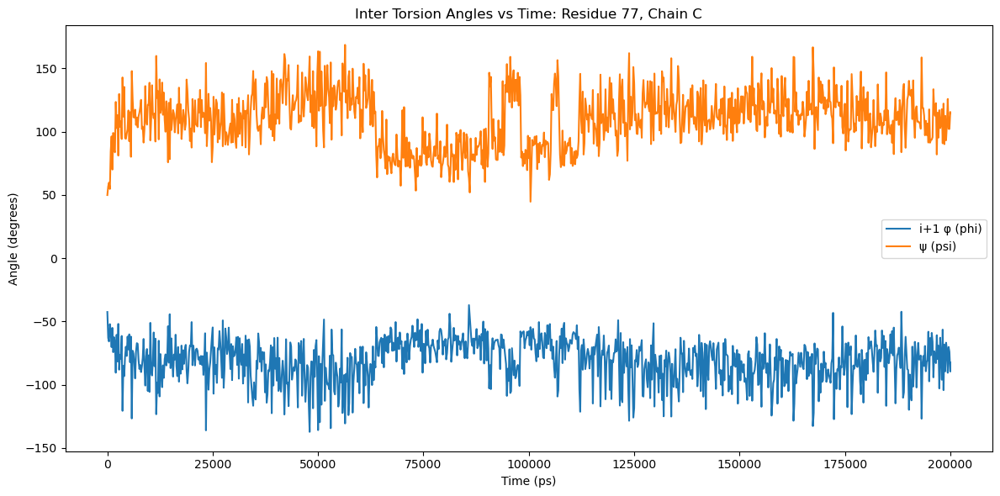

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_78_Chain_C.png


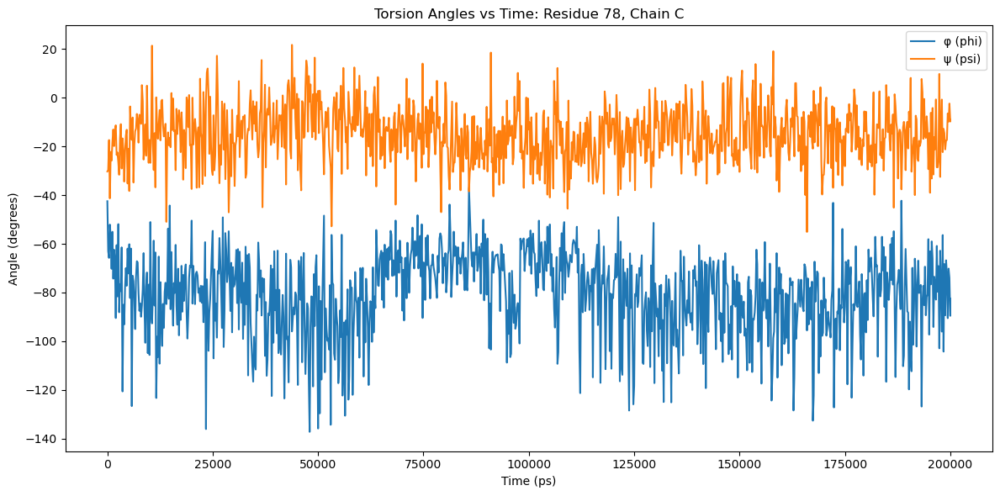

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_78_Chain_C.png


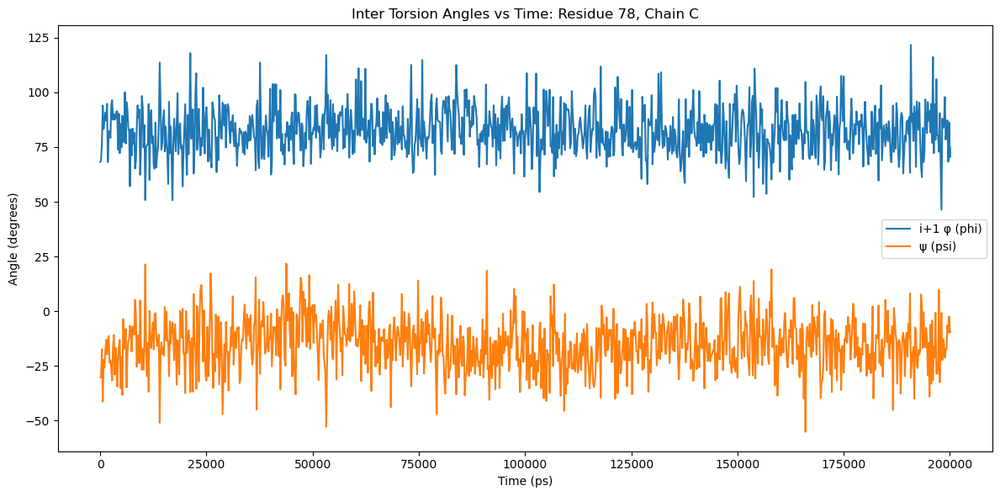

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_79_Chain_C.png


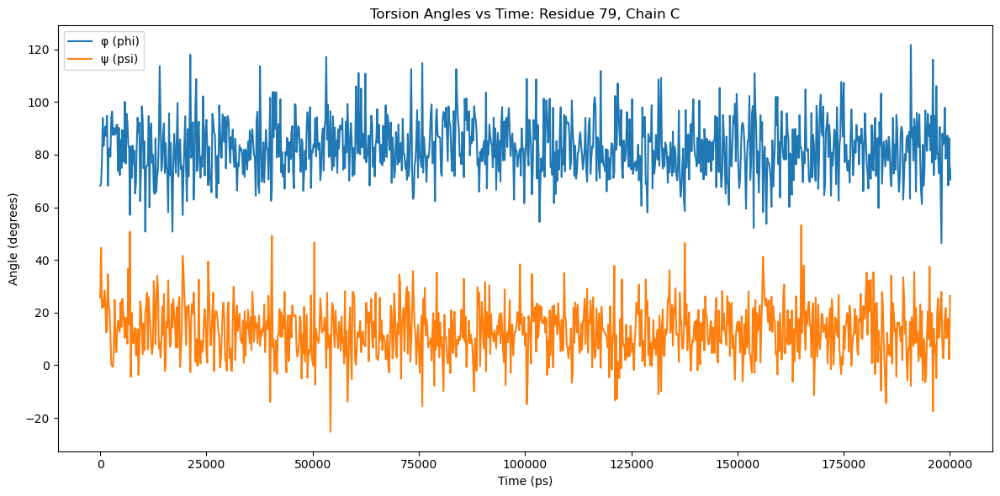

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_79_Chain_C.png


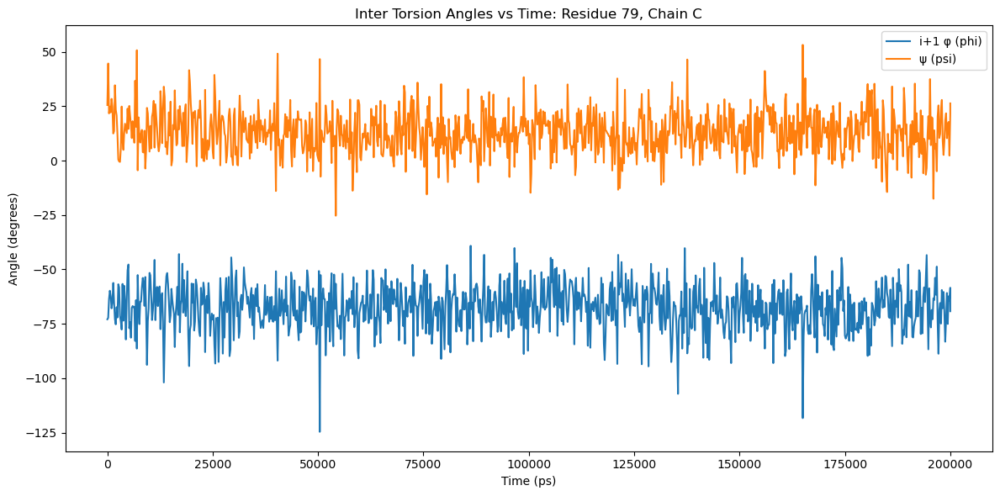

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_80_Chain_C.png


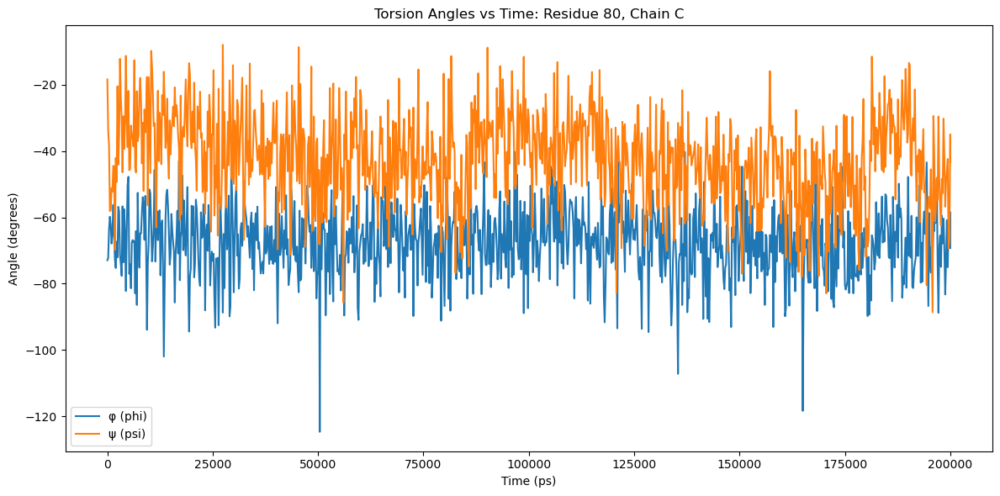

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_80_Chain_C.png


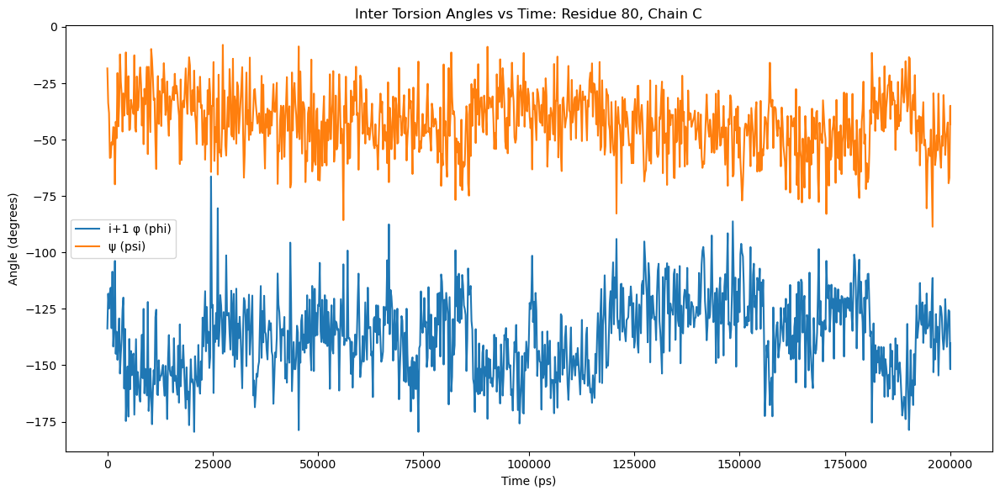

In [16]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='C', analyzer=KcsA_analyzer[2], output_dir='KcsA_torsion_vs_time_ChainC')
    plot_inter_torsion_vs_time(residue=residue, chain='C', analyzer=KcsA_analyzer[2], output_dir='KcsA_inter_torsion_vs_time_ChainC')

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_52_Chain_D.png


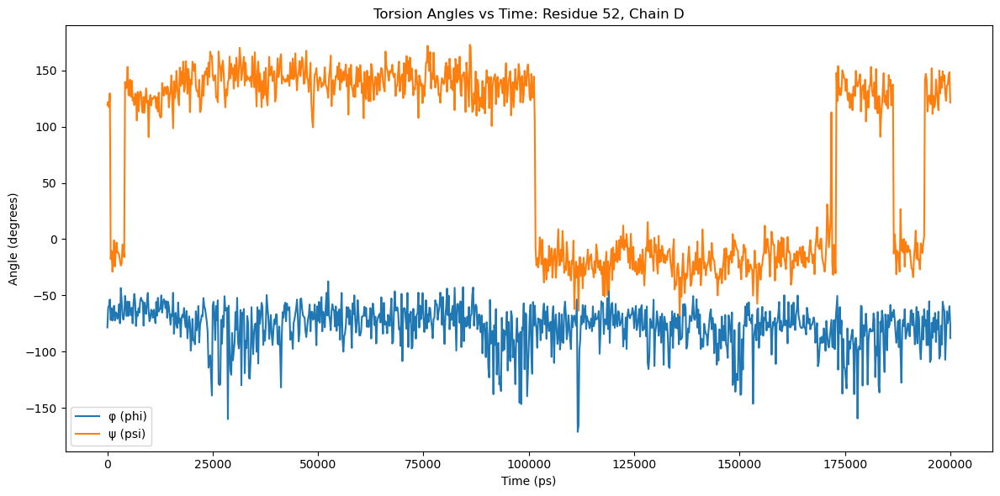

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_52_Chain_D.png


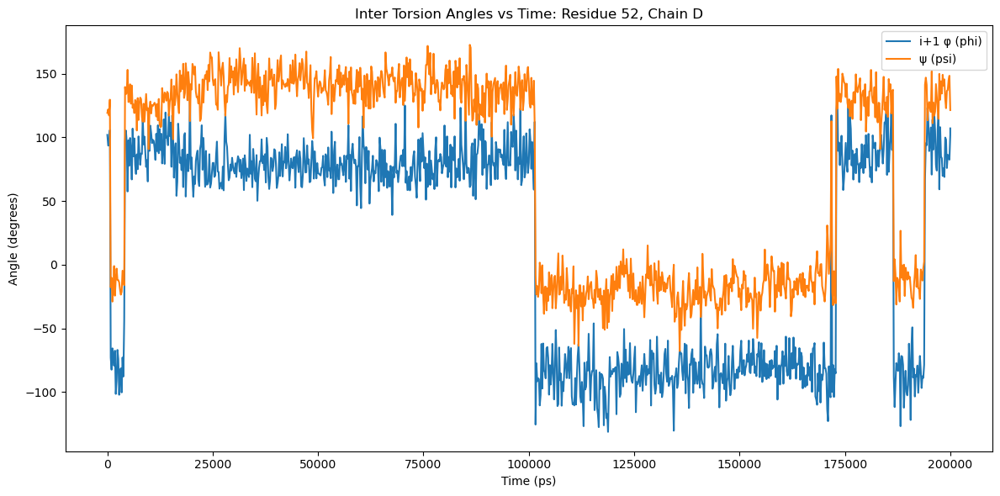

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_54_Chain_D.png


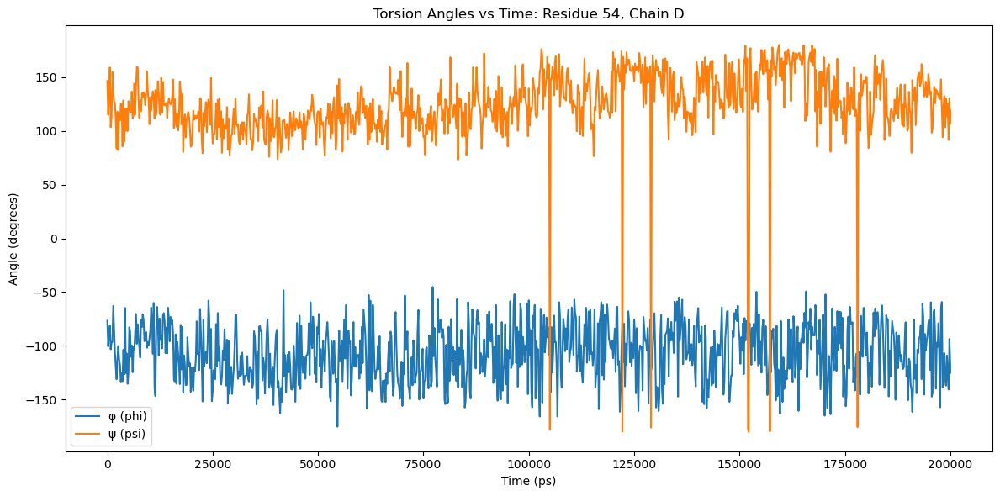

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_54_Chain_D.png


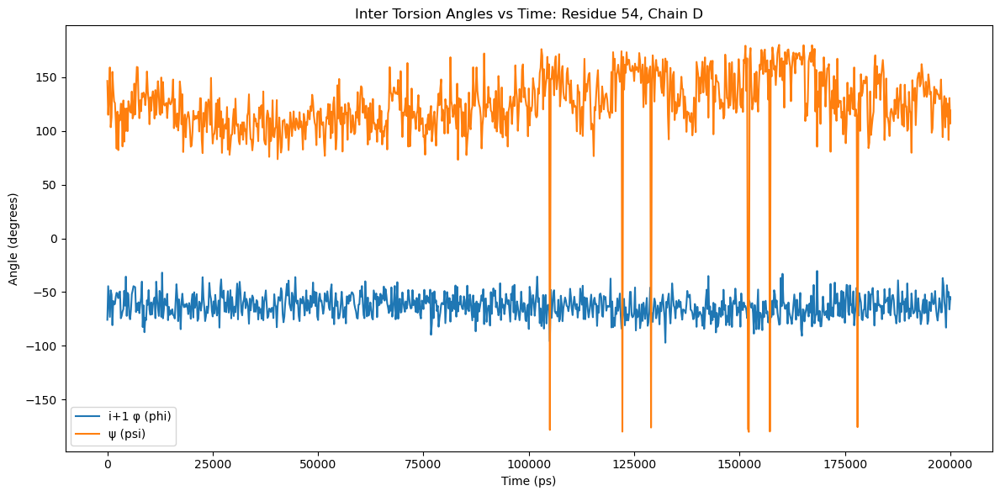

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_76_Chain_D.png


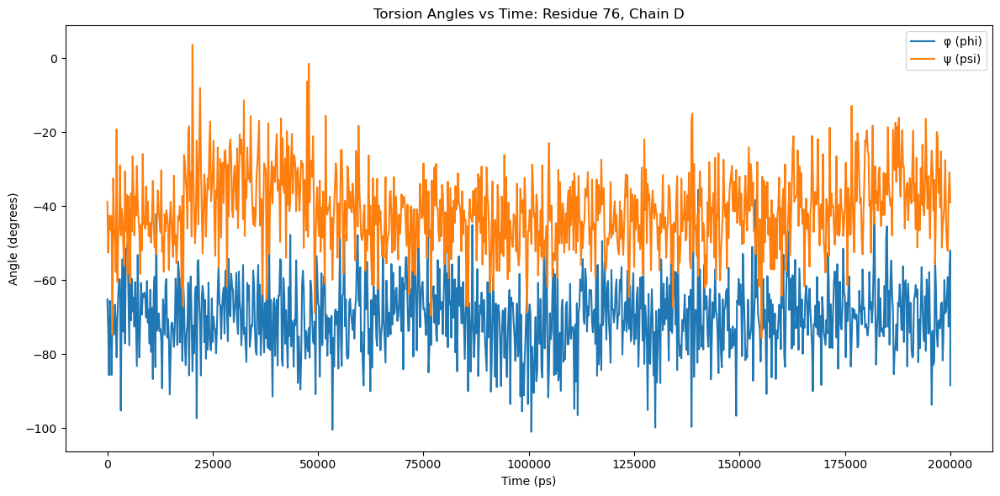

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_76_Chain_D.png


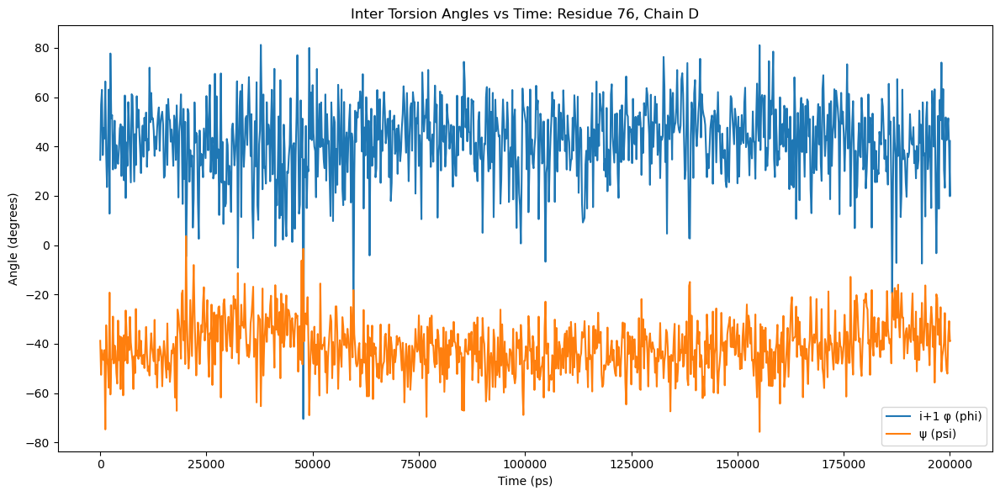

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_77_Chain_D.png


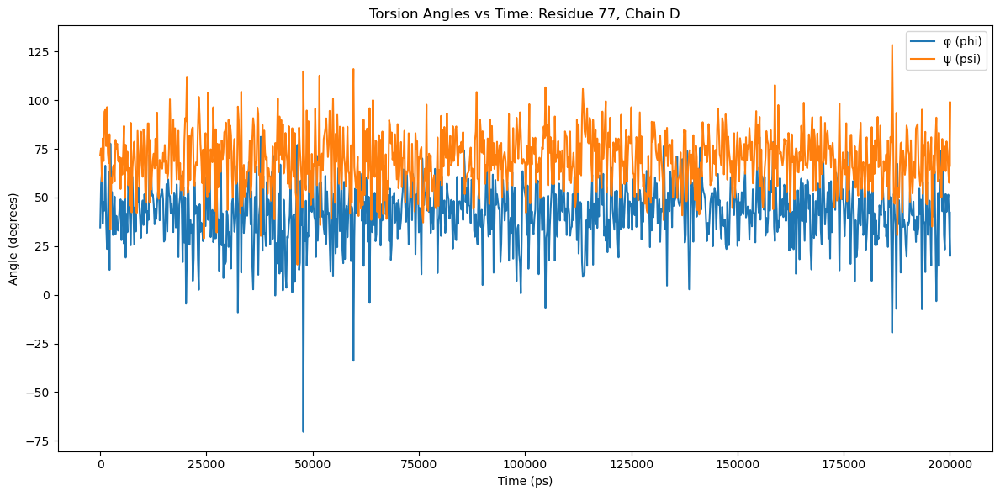

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_77_Chain_D.png


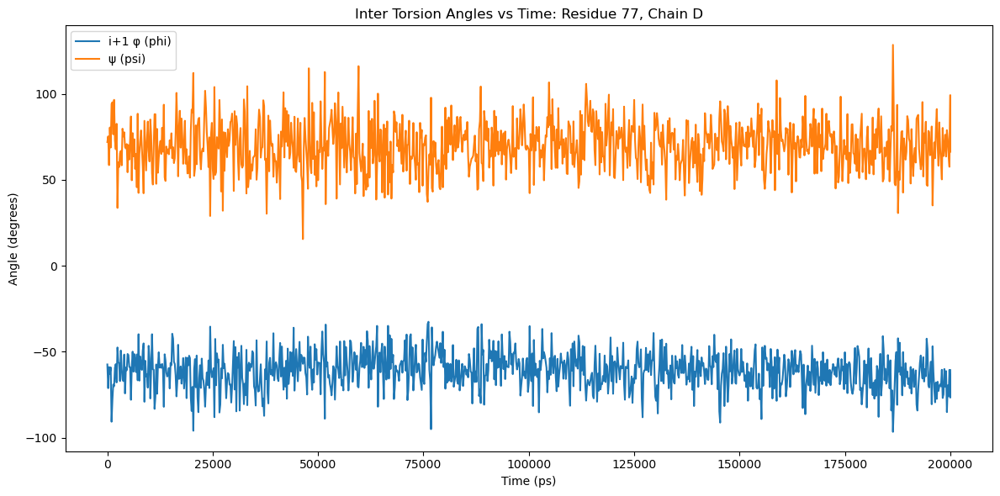

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_78_Chain_D.png


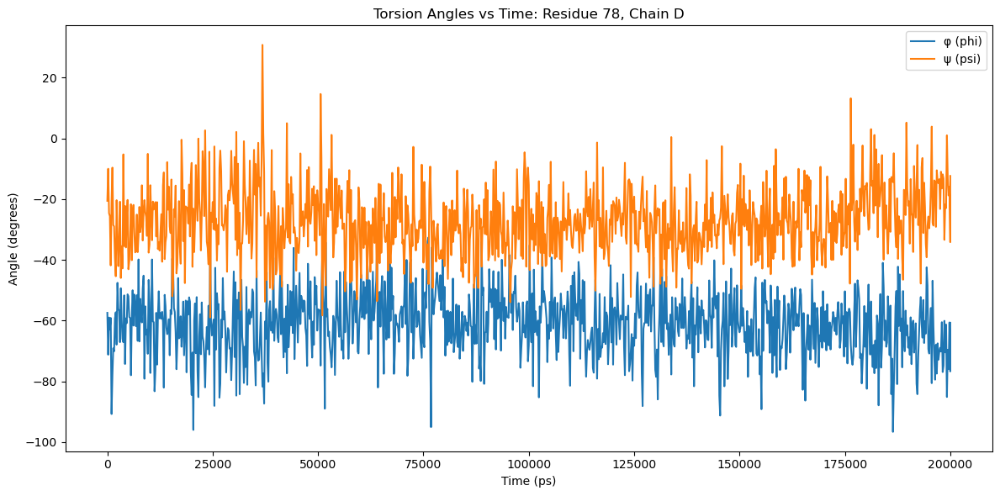

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_78_Chain_D.png


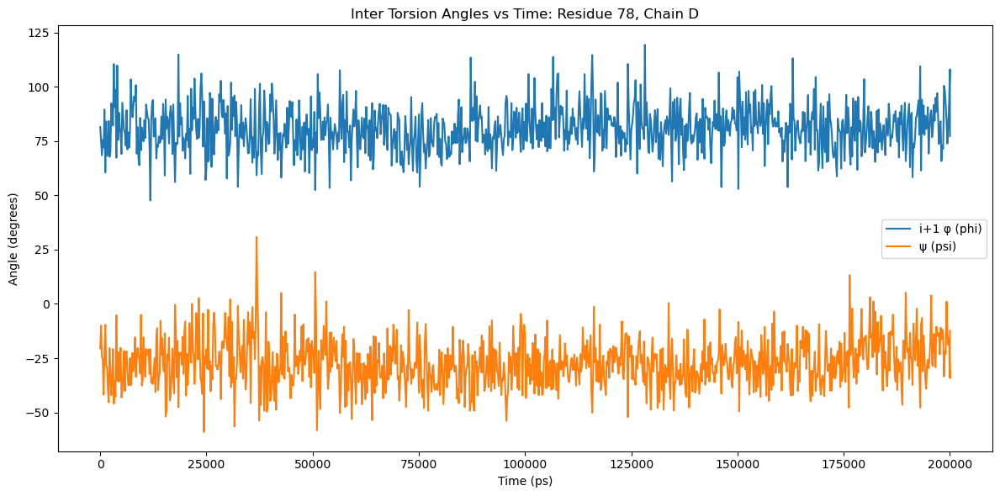

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_79_Chain_D.png


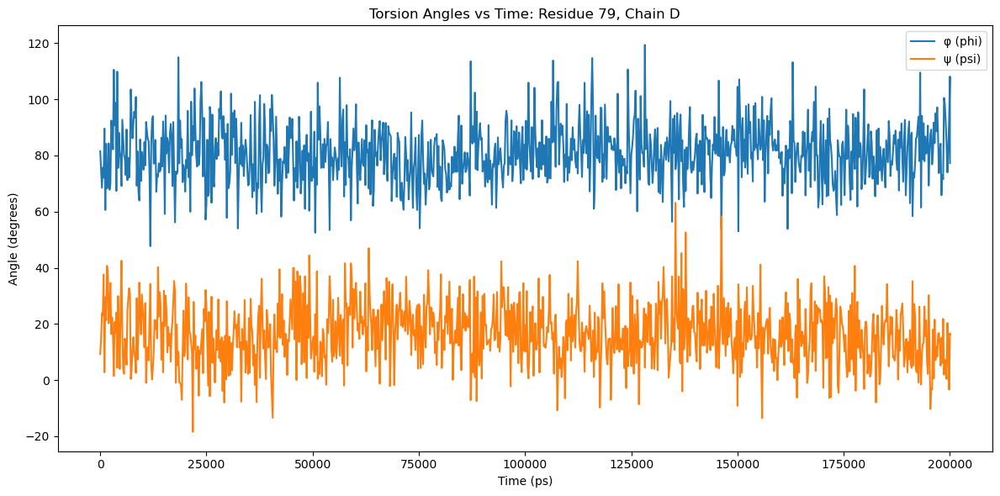

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_79_Chain_D.png


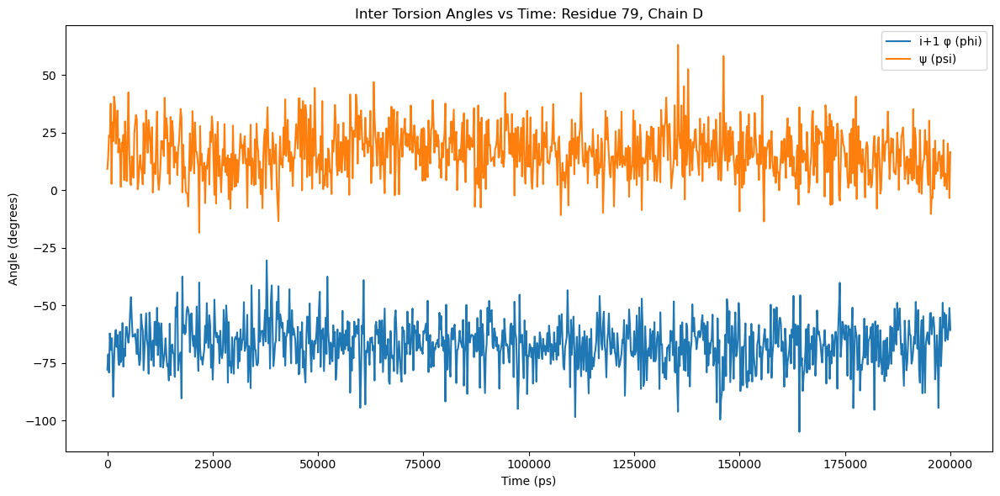

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_80_Chain_D.png


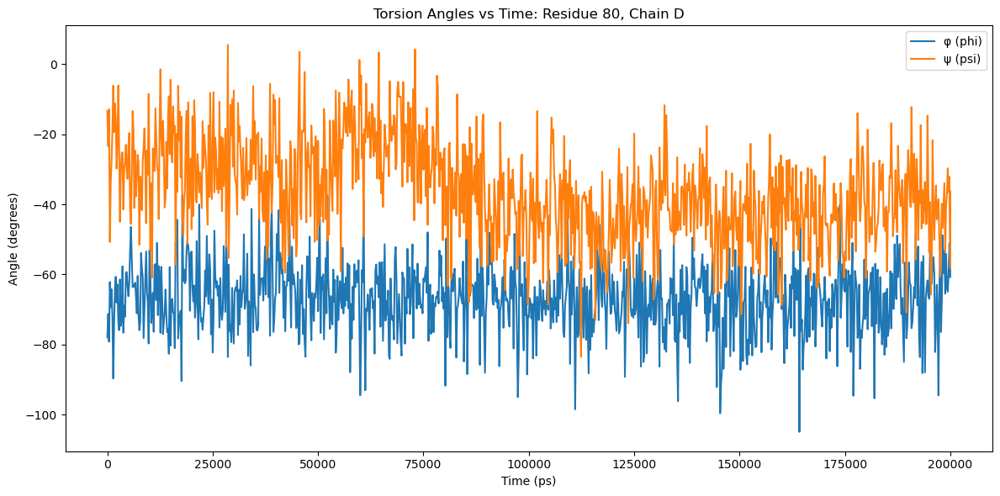

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_80_Chain_D.png


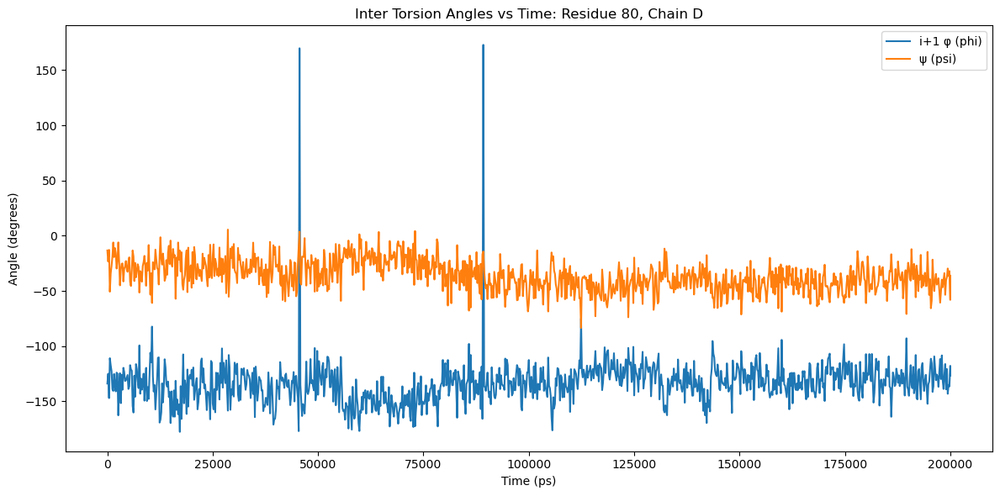

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_81_Chain_D.png


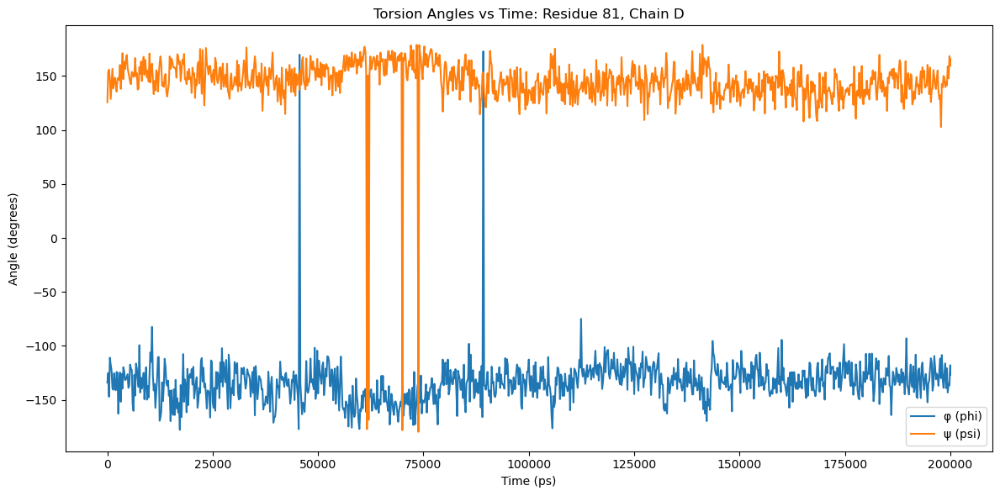

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_81_Chain_D.png


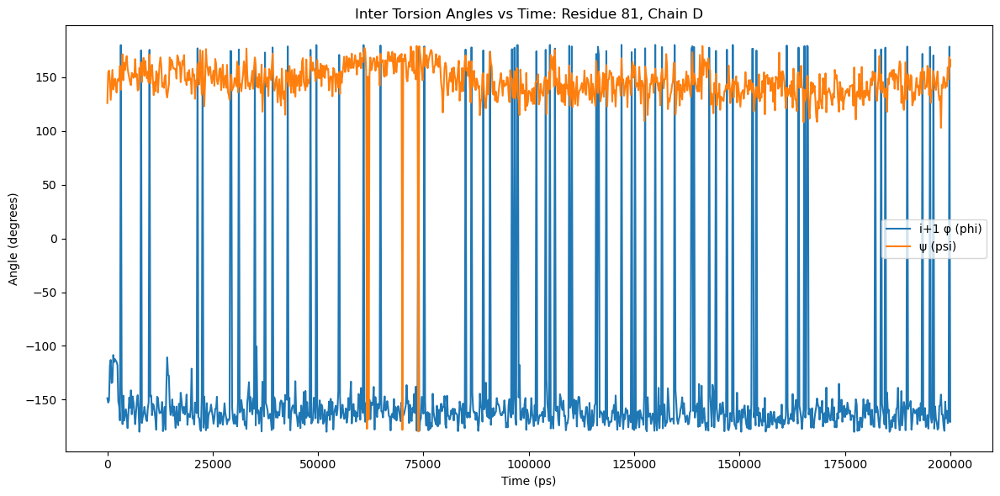

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_82_Chain_D.png


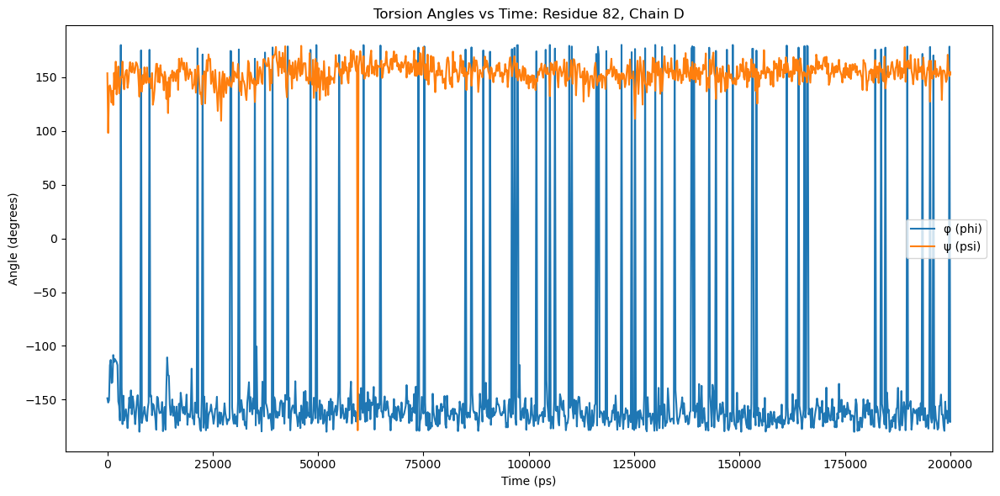

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_82_Chain_D.png


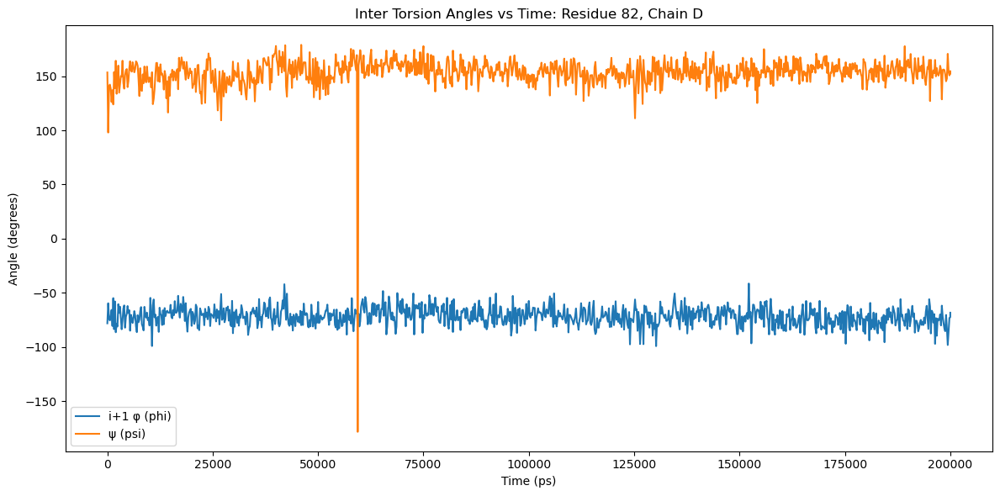

In [17]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80,81, 82]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='D', analyzer=KcsA_analyzer[3], output_dir='KcsA_torsion_vs_time_ChainD')
    plot_inter_torsion_vs_time(residue=residue, chain='D', analyzer=KcsA_analyzer[3], output_dir='KcsA_inter_torsion_vs_time_ChainD')